In [1]:
import sys
import os
sys.path.append('c:\\Users\\rokas\\Documents\\GitHub\\BCI\\mi-bci\\code')
from helper_functions import setup_logger, load_procesed_data
# Set up logger
log = setup_logger("Lee_ml_pipeline_run", log_file=os.path.join("logs", "Lee_full_dataset_ml_run_cleaned_atar.log"))
dataset_no = 20
paradigm = "MI"

run = 2
subject = 15

In [5]:
data = load_procesed_data(dataset_no, paradigm, subject, run,extra_mark='(-5_10)(8_30Hz)', include=
        'epochs_raw_autoreject')


Opening raw data file c:\Users\rokas\Documents\GitHub\BCI\mi-bci\data\raw_fif\20\MI\s15.02_raw.fif...
    Range : 0 ... 1450559 =      0.000 ...  1450.559 secs
Ready.
Reading 0 ... 1450559  =      0.000 ...  1450.559 secs...
Reading c:\Users\rokas\Documents\GitHub\BCI\mi-bci\data\procesed\20\MI\(-5_10)(8_30Hz)\15\2\s15.02_epochs_raw-epo.fif ...
    Found the data of interest:
        t =   -5000.00 ...   10000.00 ms
        0 CTF compensation matrices available
Not setting metadata
100 matching events found
No baseline correction applied
0 projection items activated
Reading c:\Users\rokas\Documents\GitHub\BCI\mi-bci\data\procesed\20\MI\(-5_10)(8_30Hz)\15\2\s15.02_epochs_raw_autoreject-epo.fif ...
    Found the data of interest:
        t =   -5000.00 ...   10000.00 ms
        0 CTF compensation matrices available
Not setting metadata
90 matching events found
No baseline correction applied
0 projection items activated


In [6]:
data['epochs_raw_autoreject']

<EpochsFIF | 90 events (all good), -5 – 10 s (baseline -6 – 0 s (baseline period was cropped after baseline correction)), ~206.1 MB, data loaded,
 'left_hand': 45
 'right_hand': 45>

Using matplotlib as 2D backend.


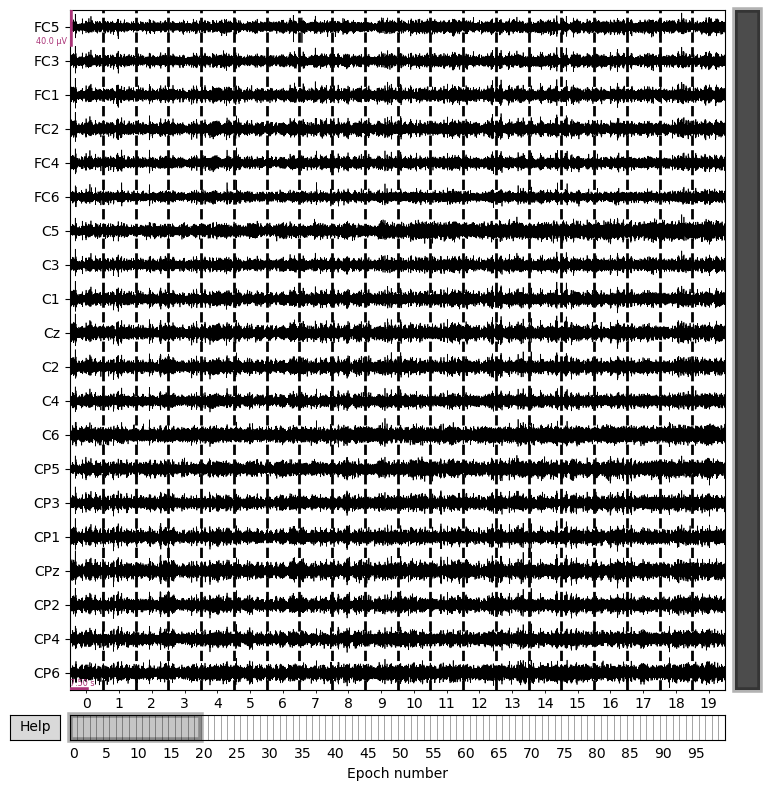

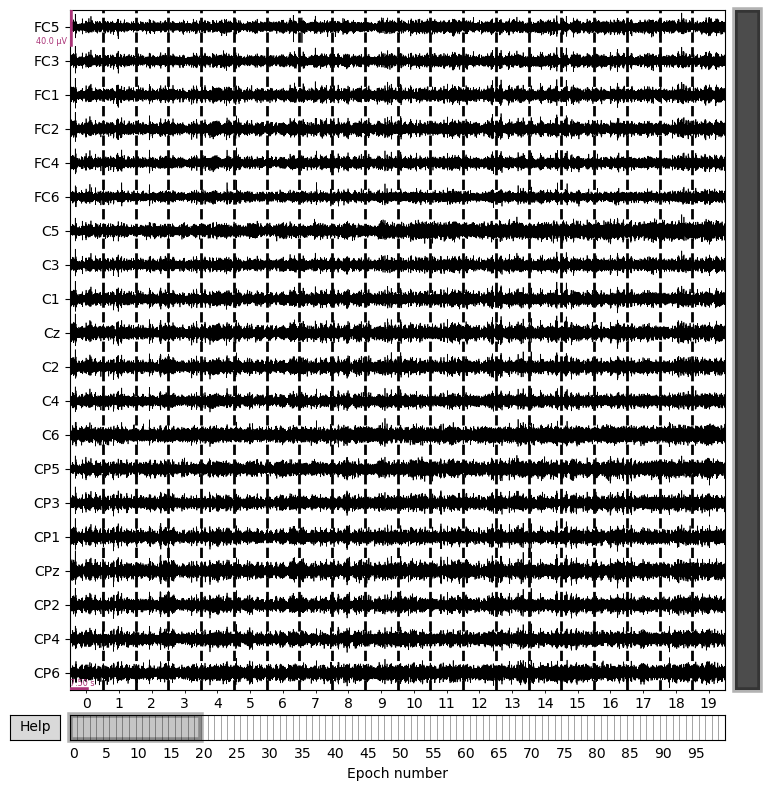

In [3]:
data['epochs_raw'].plot()

combining channels using GFP (eeg channels)
combining channels using GFP (eeg channels)


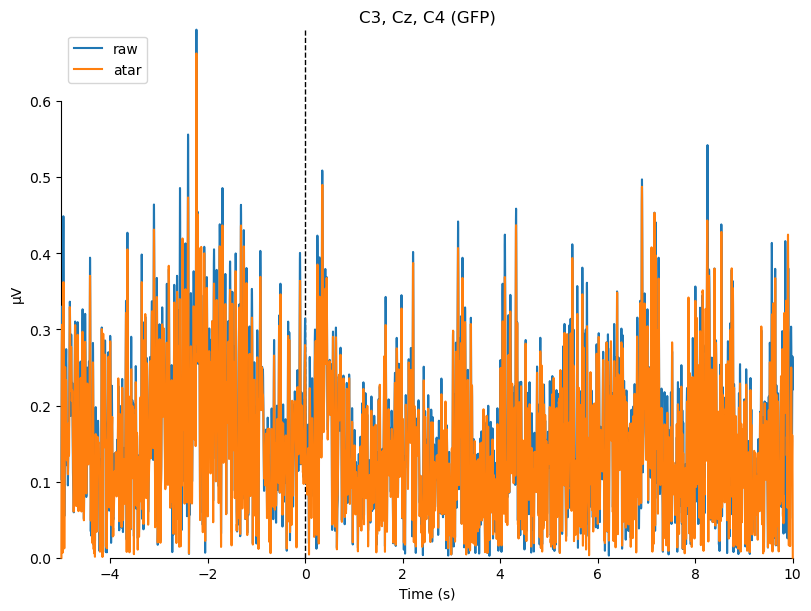

[<Figure size 800x600 with 1 Axes>]

In [32]:
# this is actually β=0.01 data
epochs_raw  = data['epochs_atar_beta0.2_OptModeelim']
# this is β=0.2 data
epochs_atar = data['epochs_raw']

# so ev_raw is really the 0.01 average, and ev_atar is 0.2
ev_raw  = epochs_raw.average()
ev_atar = epochs_atar.average()

# but then you do:
mne.viz.plot_compare_evokeds(
    dict(raw=ev_atar, atar=ev_raw),  # ← swapped!
    picks=['C3','Cz','C4']
)


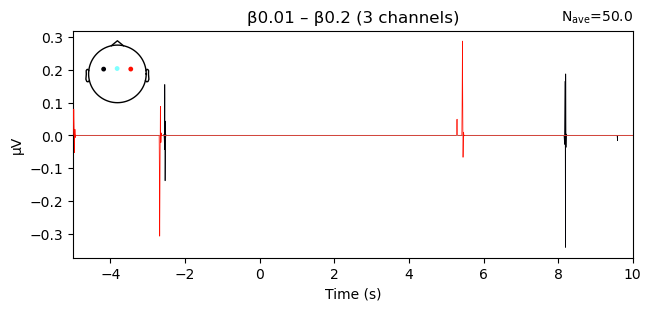

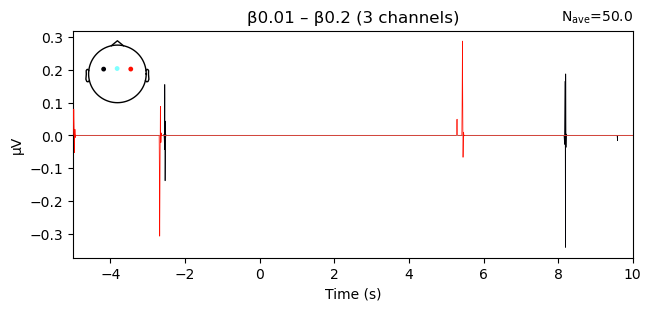

In [33]:
ev_diff = mne.combine_evoked([ev_0p01, ev_0p2], weights=[1, -1])
ev_diff.plot(picks=['C3','Cz','C4'], titles='β0.01 – β0.2')


In [34]:
import numpy as np

da = ev_0p01.data  # shape (n_channels, n_times)
db = ev_0p2.data

max_diff  = np.max(np.abs(da - db))
mean_diff = np.mean(np.abs(da - db))
r          = np.corrcoef(da.ravel(), db.ravel())[0,1]

print(f"Max abs diff  = {max_diff:.3f} μV")
print(f"Mean abs diff = {mean_diff:.3f} μV")
print(f"Correlation   = {r:.4f}")


Max abs diff  = 0.000 μV
Mean abs diff = 0.000 μV
Correlation   = 0.9999


In [29]:
import mne

ev_0p01 = data['epochs_atar_beta0.01_OptModeelim'].average()
ev_0p2  = data['epochs_atar_beta0.2_OptModeelim'].average()

mne.viz.plot_compare_evokeds(
    dict(beta0_01=ev_0p01, beta0_2=ev_0p2),
    picks=['C3','Cz','C4'],
    truncate_yaxis='auto'
)


KeyError: 'epochs_atar_beta0.2_OptModeelim'

In [ ]:
import sys
sys.path.append('c:\\Users\\rokas\\Documents\\Github\\BCI\\mi-bci\\code')
from helper_functions.data_procesing.mi_procesing import process_mi_epochs, process_mi_raw

import os
import shutil
import logging

import numpy as np
import mne
import spkit as sp
from sklearn.model_selection import ParameterGrid
from joblib import Parallel, delayed

log = logging.getLogger(__name__)

def preprocess_raw_atar(raw=None, epochs=None, event_id=None,
                        tmin=None, tmax=None,
                        preloaded=True,
                        include_raw=False,
                        save=False,
                        extra_mark='',
                        dataset_no=None,
                        paradigm=None,
                        subject=None,
                        run=None,
                        filter_data=False,
                        # ATAR minimal params:
                        beta=0.1,
                        OptMode='soft',
                        optimize=False):
    """
    Epoch + clean via ATAR (Automatic & Tunable Artifact Removal).

    You may pass either a Raw (`raw`) and `event_id` with `tmin`/`tmax`,
    or pre-constructed `epochs`.  If `optimize=True`, saves a cleaned file
    for each (`beta`,`OptMode`) without scoring.
    """
    # 1) obtain epochs
    if epochs is None:
        if raw is None or event_id is None or tmin is None or tmax is None:
            raise ValueError(
                "Must provide either `epochs` or (`raw`, `event_id`, `tmin`, `tmax`)."
            )
        if filter_data:
            raw = process_mi_raw(raw)
        events, _ = mne.events_from_annotations(raw)
        epochs_raw = mne.Epochs(
            raw, events, event_id,
            tmin, tmax,
            preload=preloaded,
            baseline=None,
            verbose=False
        )
        if not preloaded:
            temp_dir = os.path.join(os.getcwd(), 'data', 'temp')
            os.makedirs(temp_dir, exist_ok=True)
            epochs_raw.save(
                os.path.join(temp_dir, 'tmp-epo.fif'),
                overwrite=True
            )
            epochs_raw = mne.read_epochs(
                os.path.join(temp_dir, 'tmp-epo.fif'),
                preload=True, verbose=False
            )
            shutil.rmtree(temp_dir)
        epochs = epochs_raw.copy()
    else:
        if not hasattr(epochs, 'get_data'):
            raise ValueError("`epochs` must be an MNE Epochs object.")
        epochs_raw = None

    # MI-specific post-epoch processing
    epochs = process_mi_epochs(epochs)

    sfreq = epochs.info['sfreq']
    data = epochs.get_data()

    # prepare save directory
    if save:
        if None in (dataset_no, paradigm, subject, run):
            raise ValueError(
                "To save, provide `dataset_no`, `paradigm`, `subject`, and `run`."
            )
        save_root = os.path.join(
            os.getcwd(), 'data', 'processed','ATAR',
            str(dataset_no), paradigm, extra_mark,
            f"{subject:02d}", f"{run:02d}"
        )
        os.makedirs(save_root, exist_ok=True)

    def run_atar(beta_val, mode_val):
        def process_epoch(epoch):
            X = epoch.T
            Xr = sp.eeg.ATAR(
                X, fs=sfreq,
                beta=beta_val,
                OptMode=mode_val,
                k1=10.0e-6,
                k2=100.0e-6
            )
            return Xr.T

        cleaned_tmp = Parallel(n_jobs=-1, backend="loky")(
            delayed(process_epoch)(epoch) for epoch in data
        )

        return np.array(cleaned_tmp)

    # 5) optimization or single-run
    if optimize:
        grid = {
            'beta': [0.01, 0.05, 0.1, 0.2, 0.5],
            'OptMode': ['soft', 'linAtten', 'elim']
        }
        for params in ParameterGrid(grid):
            cleaned_temp = run_atar(params['beta'], params['OptMode'])
            if save:
                temp_epochs = epochs.copy()
                temp_epochs._data = cleaned_temp
                fname = os.path.join(
                    save_root,
                    f"s{subject:02d}.{run:02d}_beta{params['beta']}_OptMode{params['OptMode']}.fif"
                )
                temp_epochs.save(fname, overwrite=True)
                log.info(f"Saved ATAR epochs: {fname}")
        cleaned = cleaned_temp
    else:
        cleaned = run_atar(beta, OptMode)

    # assemble cleaned epochs
    epochs_atar = epochs.copy()
    epochs_atar._data = cleaned

    # return as dict
    result = {'epochs_atar': epochs_atar}
    if include_raw:
        result['epochs_raw'] = epochs_raw

    return result


In [22]:

import sys
sys.path.append('c:\\Users\\rokas\\Documents\\Github\\BCI\\mi-bci\\code')
from helper_functions import setup_logger
from helper_functions.data_procesing.mi_procesing import process_mi_raw
import matplotlib.pyplot as plt
from helper_functions import setup_logger, load_procesed_data
from datasets import Lee2019
import os
import glob
import mne
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib.colors import TwoSlopeNorm
from mne.stats import permutation_cluster_1samp_test as pcluster_test

from datasets import Lee2019

log = setup_logger("Lee_preprocess")

dataset = Lee2019()
dataset_no = 20
subject = 10
run = 1
paradigm = "MI"
tmin = -1.2
tmax = 5.2
event_id = dict(left_hand=2, right_hand=1)

raw_fif = dataset.load_one_raw_fif(subject=subject, run=run, paradigm=paradigm)


Opening raw data file c:\Users\rokas\Documents\GitHub\BCI\mi-bci\data\raw_fif\20\MI\s10.01_raw.fif...
    Range : 0 ... 1521879 =      0.000 ...  1521.879 secs
Ready.
Reading 0 ... 1521879  =      0.000 ...  1521.879 secs...


In [ ]:
kazkas = preprocess_raw_atar(raw=raw_fif, event_id=dict(left_hand=2, right_hand=1),
                        tmin=-5, tmax=10,
                        preloaded=False,
                        include_raw=True,
                        save=True,
                        extra_mark='Test',
                        dataset_no=20,
                        paradigm='MI',
                        subject=subject,
                        run=run,
                        filter_data=True,
                        # ATAR minimal params:
                        beta=0.1,
                        OptMode='soft',
                        optimize=False) #loky

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 8 - 30 Hz

IIR filter parameters
---------------------
Butterworth bandpass zero-phase (two-pass forward and reverse) non-causal filter:
- Filter order 20 (effective, after forward-backward)
- Cutoffs at 8.00, 30.00 Hz: -6.02, -6.02 dB

Used Annotations descriptions: ['1', '2']
Using data from preloaded Raw for 100 events and 15001 original time points ...
0 bad epochs dropped
Using data from preloaded Raw for 1 events and 15001 original time points ...
Using data from preloaded Raw for 100 events and 15001 original time points ...
Setting up band-pass filter from 8 - 30 Hz

IIR filter parameters
---------------------
Butterworth bandpass zero-phase (two-pass forward and reverse) non-causal filter:
- Filter order 20 (effective, after forward-backward)
- Cutoffs at 8.00, 30.00 Hz: -6.02, -6.02 dB



In [ ]:
import os
import shutil
import logging

import numpy as np
import mne
import spkit as sp
from sklearn.model_selection import ParameterGrid

log = logging.getLogger(__name__)

def preprocess_raw_atar(raw, event_id,
                        tmin, tmax,
                        preloaded=True,
                        include_raw=False,
                        save=False,
                        extra_mark='',
                        dataset_no=None,
                        paradigm=None,
                        subject=None,
                        run=None,
                        filter_data=False,
                        # ATAR minimal params:
                        beta=0.1,
                        OptMode='soft',
                        optimize=False):

    # 1) sanity check
    if tmin is None or tmax is None:
        raise ValueError("Both tmin and tmax must be specified.")

    # 2) optional band-pass
    if filter_data:
        # pridėti savo filtro funkcijas
        
    # 3) epoch creation
    events = mne.find_events(raw, verbose=False)
    epochs_raw = mne.Epochs(raw, events, event_id,
                            tmin, tmax,
                            preload=preloaded,
                            baseline=None,
                            verbose=False)

    # 4) force-reload if needed
    if not preloaded:
        temp_dir = os.path.join(os.getcwd(), 'data', 'temp')
        os.makedirs(temp_dir, exist_ok=True)
        epochs_raw.save(os.path.join(temp_dir, 'tmp-epo.fif'), overwrite=True)
        epochs_raw = mne.read_epochs(os.path.join(temp_dir, 'tmp-epo.fif'),
                                     preload=True, verbose=False)
        shutil.rmtree(temp_dir)

    sfreq = raw.info['sfreq']
    data = epochs_raw.get_data()  # (n_epochs, n_ch, n_times)

    # prepare save directory
    if save:
        save_root = os.path.join(
            os.getcwd(), 'data', 'procesed',
            str(dataset_no), paradigm, extra_mark,
            f"{subject:02d}", f"{run:02d}"
        )
        os.makedirs(save_root, exist_ok=True)

    def run_atar(beta_val, mode_val):
        cleaned_tmp = np.zeros_like(data)
        for idx, epoch in enumerate(data):
            X = epoch.T
            Xr = sp.eeg.ATAR(
                X, fs=sfreq,
                beta=beta_val,
                OptMode=mode_val
            )
            cleaned_tmp[idx] = Xr.T
        return cleaned_tmp

    # 5) optimization or single-run
    if optimize:
        grid = {
            'beta':    [0.01, 0.05, 0.1, 0.2, 0.5],
            'OptMode': ['soft', 'linAtten', 'elim']
        }
        best_score = np.inf
        best_params = None
        best_cleaned = None

        for params in ParameterGrid(grid):
            cleaned_temp = run_atar(params['beta'], params['OptMode'])

            # save each cleaned result
            if save:
                temp_epochs = epochs_raw.copy()
                temp_epochs._data = cleaned_temp
                fname = os.path.join(
                    save_root,
                    f"s{subject:02d}.{run:02d}_beta{params['beta']}_OptMode{params['OptMode']}.fif"
                )
                temp_epochs.save(fname, overwrite=True)
                log.info(f"Saved ATAR epochs: {fname}")

            score = np.mean(np.ptp(cleaned_temp, axis=2))
            if score < best_score:
                best_score = score
                best_params = params
                best_cleaned = cleaned_temp

        log.info(f"Best ATAR params: {best_params}, ptp = {best_score:.3f}")
        cleaned = best_cleaned
    else:
        cleaned = run_atar(beta, OptMode)

    # 6) assemble cleaned epochs
    epochs_atar = epochs_raw.copy()
    epochs_atar._data = cleaned

    # 7) final save of best if optimize
    if save and optimize:
        fname_best = os.path.join(
            save_root,
            f"s{subject:02d}.{run:02d}_best_beta{best_params['beta']}_OptMode{best_params['OptMode']}.fif"
        )
        epochs_atar.save(fname_best, overwrite=True)
        log.info(f"Saved best ATAR epochs: {fname_best}")

    # 8) return
    if include_raw:
        return epochs_raw, epochs_atar
    return epochs_atar


In [ ]:
import sys
import os
import pickle
from datetime import datetime

sys.path.append('c:\\Users\\rokas\\Documents\\GitHub\\BCI\\mi-bci\\code')
from pipelines.ml_pipelines import all_ml_pipelines
from evaluation import cs_evaluate
from helper_functions import setup_logger, load_procesed_data
from datasets import Lee2019
from pipelines.ml_pipelines_ba import features, classifiers


# Define the folder for the checkpoint

log = setup_logger("Lee_ml_pipeline_run", log_file=os.path.join("logs", "Lee_full_dataset_ml_run_cs_eval_04.log"))
os.makedirs("logs", exist_ok=True)
dataset_no = 20
paradigm = "MI"



for subject in range(0, 2):
        try:
            data_run1 = load_procesed_data(dataset_no, paradigm, subject, run=1, include=['epochs_raw'], 
                                        extra_mark=('(-5_10)(8_30Hz)'))
            epochs_run1 = data_run1["epochs_raw"]

            data_run2 = load_procesed_data(dataset_no, paradigm, subject, run=2, include=['epochs_raw'], 
                                        extra_mark=('(-5_10)(8_30Hz)'))
            epochs_run2 = data_run2["epochs_raw"]
            
            epochs = {'1':epochs_run1,'2':epochs_run2}
            
        except Exception as e:
            log.error(f"Error processing subject {subject}")
            log.error(f"Error details: {e}")



2025-04-16 11:34:44,788 - Lee_ml_pipeline_run - ERROR - Error processing subject 0
2025-04-16 11:34:44,791 - Lee_ml_pipeline_run - ERROR - Error details: File does not exist: "c:\Users\rokas\Documents\GitHub\BCI\mi-bci\data\procesed\20\MI\(-5_10)(8_30Hz)\0\1\s00.01_epochs_raw-epo.fif"


Reading c:\Users\rokas\Documents\GitHub\BCI\mi-bci\data\procesed\20\MI\(-5_10)(8_30Hz)\1\1\s01.01_epochs_raw-epo.fif ...
    Found the data of interest:
        t =   -5000.00 ...   10000.00 ms
        0 CTF compensation matrices available
Not setting metadata
100 matching events found
No baseline correction applied
0 projection items activated
Reading c:\Users\rokas\Documents\GitHub\BCI\mi-bci\data\procesed\20\MI\(-5_10)(8_30Hz)\1\2\s01.02_epochs_raw-epo.fif ...
    Found the data of interest:
        t =   -5000.00 ...   10000.00 ms
        0 CTF compensation matrices available
Not setting metadata
100 matching events found
No baseline correction applied
0 projection items activated


In [6]:
train_run='1'
epochs_train = epochs[str(train_run)]


In [7]:
epochs_train

<EpochsFIF | 100 events (all good), -5 – 10 s (baseline -5 – 0 s), ~228.9 MB, data loaded,
 '1': 50
 '2': 50>

In [3]:
import sys
import mne
sys.path.append('c:\\Users\\rokas\\Documents\\GitHub\\BCI\\mi-bci\\code')
from helper_functions import preprocess_raw_autoreject, save_epochs, setup_logger
from datasets import Lee2019

log = setup_logger("Lee_preprocess")

dataset = Lee2019()

# dataset.initialize()

paradigm = "MI"
tmin = -5
tmax = 10
#epohuoja tik su autorejectu

for subject in [0,1]:
    for run in [1,1]:
        try:
            raw = dataset.load_one_raw_fif(subject=subject,paradigm=paradigm,run=run)
        except Exception as e:
            log.error(f"Error with subject-{subject}, run-{run}: {e}")
            
            

Opening raw data file c:\Users\rokas\Documents\GitHub\BCI\mi-bci\data\raw_fif\20\MI\s00.01_raw.fif...


2025-04-15 21:23:54,244 - Lee2019 - ERROR - Failed to load raw data for subject 0: fname does not exist: "c:\Users\rokas\Documents\GitHub\BCI\mi-bci\data\raw_fif\20\MI\s00.01_raw.fif"


Opening raw data file c:\Users\rokas\Documents\GitHub\BCI\mi-bci\data\raw_fif\20\MI\s00.01_raw.fif...


2025-04-15 21:23:54,248 - Lee2019 - ERROR - Failed to load raw data for subject 0: fname does not exist: "c:\Users\rokas\Documents\GitHub\BCI\mi-bci\data\raw_fif\20\MI\s00.01_raw.fif"


Opening raw data file c:\Users\rokas\Documents\GitHub\BCI\mi-bci\data\raw_fif\20\MI\s01.01_raw.fif...


    Range : 0 ... 1418039 =      0.000 ...  1418.039 secs
Ready.
Reading 0 ... 1418039  =      0.000 ...  1418.039 secs...
Opening raw data file c:\Users\rokas\Documents\GitHub\BCI\mi-bci\data\raw_fif\20\MI\s01.01_raw.fif...
    Range : 0 ... 1418039 =      0.000 ...  1418.039 secs
Ready.
Reading 0 ... 1418039  =      0.000 ...  1418.039 secs...


In [4]:
raw

<Raw | s01.01_raw.fif, 67 x 1418040 (1418.0 s), ~725.0 MB, data loaded>

In [3]:

import sys
sys.path.append('c:\\Users\\rokas\\Documents\\Github\\BCI\\mi-bci\\code')
from helper_functions import setup_logger
from helper_functions.data_procesing.mi_procesing import process_mi_raw
import matplotlib.pyplot as plt
from helper_functions import setup_logger, load_procesed_data
from datasets import Lee2019
import os
import glob
import mne
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib.colors import TwoSlopeNorm
from mne.stats import permutation_cluster_1samp_test as pcluster_test

from datasets import Lee2019


In [12]:
import sys
import os
import pickle
from datetime import datetime

sys.path.append('c:\\Users\\rokas\\Documents\\GitHub\\BCI\\mi-bci\\code')
from pipelines.ml_pipelines_ba import features, classifiers
from evaluation import train_and_evaluate
from helper_functions import setup_logger, load_procesed_data, process_mi_epochs
from datasets import Lee2019
import os
import glob
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from IPython.display import Markdown, display

# Set up logger
log = setup_logger("Lee_ml_pipeline_run", log_file=os.path.join("logs", "Lee_full_dataset_ml_run.log"))
dataset_no = 20
paradigm = "MI"
subject = 4
run = 2

data = load_procesed_data(dataset_no, paradigm, subject, run, include=['epochs_raw'])
epochs = data["epochs_raw"]


Reading c:\Users\rokas\Documents\GitHub\BCI\mi-bci\data\procesed\20\MI\4\2\s04.02_epochs_raw-epo.fif ...
    Found the data of interest:
        t =   -1200.00 ...    5200.00 ms
        0 CTF compensation matrices available
Not setting metadata
100 matching events found
No baseline correction applied
0 projection items activated


In [13]:
raw_fif = dataset.load_one_raw_fif(subject=subject, run=run, paradigm=paradigm)

Opening raw data file c:\Users\rokas\Documents\GitHub\BCI\mi-bci\data\raw_fif\20\MI\s04.02_raw.fif...
    Range : 0 ... 1376039 =      0.000 ...  1376.039 secs
Ready.
Reading 0 ... 1376039  =      0.000 ...  1376.039 secs...


Using matplotlib as 2D backend.


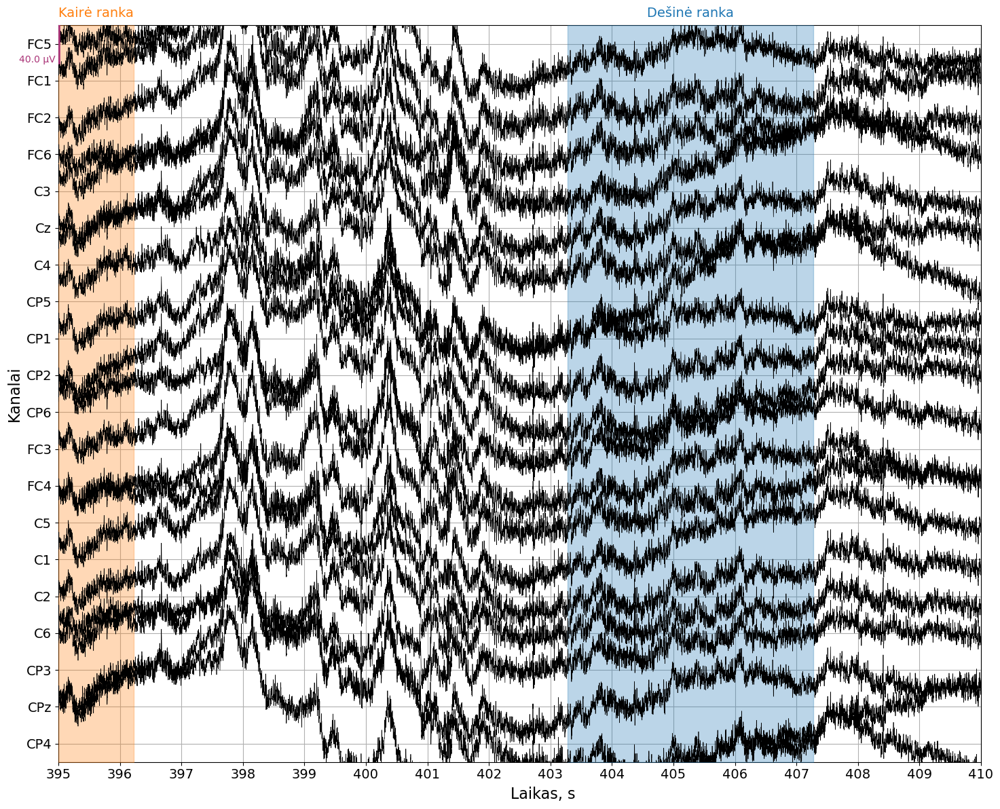

In [6]:
fig = raw_fif.plot(
    start=395,
    duration=15,
    picks=[
        'FC5', 'FC3', 'FC1', 'FC2', 'FC4', 'FC6',
        'C5', 'C3', 'C1', 'Cz', 'C2', 'C4', 'C6',
        'CP5', 'CP3', 'CP1', 'CPz', 'CP2', 'CP4', 'CP6'
    ],
    show=False,
    block=False
)

fig.set_size_inches(15, 12)

ax_main = fig.axes[0]
ax_main.set_ylabel("Kanalai", fontsize=16)
ax_main.grid(True)
ax_main.tick_params(axis='both', which='major', labelsize=14)

for extra_ax in fig.axes[1:]:
    extra_ax.set_visible(False)

ax_main.text(0.525, -0.05, "Laikas, s", transform=ax_main.transAxes,
             ha='center', fontsize=16)

for txt in fig.findobj(match=plt.Text):
    current_text = txt.get_text()
    if "1" in current_text:
        txt.set_text("Dešinė ranka")
        txt.set_fontsize(14) 
    if "2" in current_text:
        txt.set_text("Kairė ranka")
        txt.set_fontsize(14)  
    if "µV" in current_text:
        txt.set_fontsize(10)

for line in ax_main.get_lines():
    label = line.get_label() 
    # print(label)
    if '_child2'or'_child3' in label:
        line.set_clip_on(True)
        line.set_clip_path(ax_main.patch)
    else:
        line.set_clip_on(False)

xlim = ax_main.get_xlim()
ticks = np.arange(np.floor(xlim[0]), np.ceil(xlim[1]), 1)
ax_main.set_xticks(ticks)

plt.tight_layout()
plt.show()


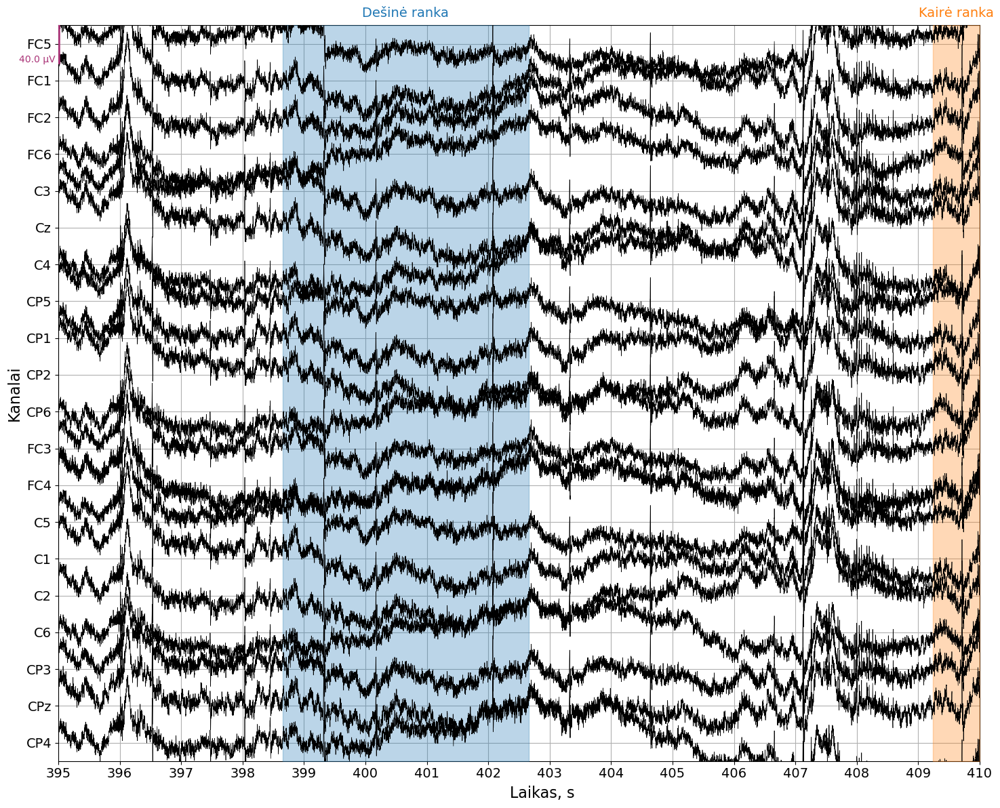

In [14]:
fig = raw_fif.plot(
    start=395,
    duration=15,
    picks=[
        'FC5', 'FC3', 'FC1', 'FC2', 'FC4', 'FC6',
        'C5', 'C3', 'C1', 'Cz', 'C2', 'C4', 'C6',
        'CP5', 'CP3', 'CP1', 'CPz', 'CP2', 'CP4', 'CP6'
    ],
    show=False,
    block=False
)

fig.set_size_inches(15, 12)

ax_main = fig.axes[0]
ax_main.set_ylabel("Kanalai", fontsize=16)
ax_main.grid(True)
ax_main.tick_params(axis='both', which='major', labelsize=14)

for extra_ax in fig.axes[1:]:
    extra_ax.set_visible(False)

ax_main.text(0.525, -0.05, "Laikas, s", transform=ax_main.transAxes,
             ha='center', fontsize=16)

for txt in fig.findobj(match=plt.Text):
    current_text = txt.get_text()
    if "1" in current_text:
        txt.set_text("Dešinė ranka")
        txt.set_fontsize(14) 
    if "2" in current_text:
        txt.set_text("Kairė ranka")
        txt.set_fontsize(14)  
    if "µV" in current_text:
        txt.set_fontsize(10)

for line in ax_main.get_lines():
    label = line.get_label() 
    # print(label)
    if '_child2'or'_child3' in label:
        line.set_clip_on(True)
        line.set_clip_path(ax_main.patch)
    else:
        line.set_clip_on(False)

xlim = ax_main.get_xlim()
ticks = np.arange(np.floor(xlim[0]), np.ceil(xlim[1]), 1)
ax_main.set_xticks(ticks)

plt.tight_layout()
plt.show()


In [15]:
raw_clean = process_mi_raw(raw_fif.copy())

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 8 - 30 Hz

IIR filter parameters
---------------------
Butterworth bandpass zero-phase (two-pass forward and reverse) non-causal filter:
- Filter order 20 (effective, after forward-backward)
- Cutoffs at 8.00, 30.00 Hz: -6.02, -6.02 dB



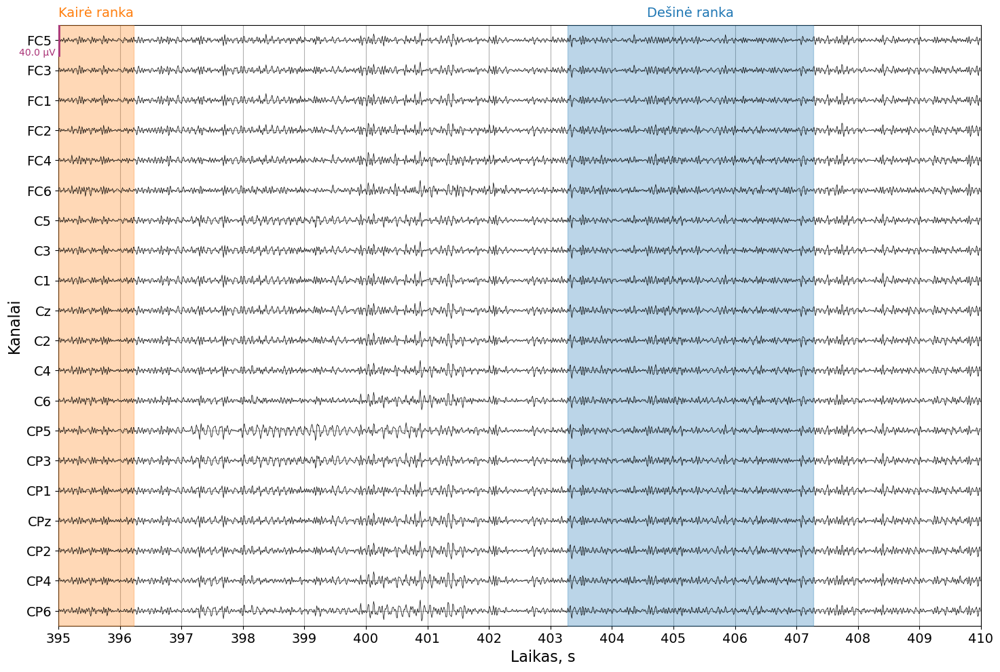

In [8]:
fig = raw_clean.plot(start=395, duration=15,
    picks=[
        'FC5', 'FC3', 'FC1', 'FC2', 'FC4', 'FC6',
        'C5', 'C3', 'C1', 'Cz', 'C2', 'C4', 'C6',
        'CP5', 'CP3', 'CP1', 'CPz', 'CP2', 'CP4', 'CP6'
    ],
    show=False,
    block=False)

# Change the figure size
fig.set_size_inches(15, 10)

ax_main = fig.axes[0]
ax_main.set_ylabel("Kanalai", fontsize=16)
ax_main.grid(True)
ax_main.tick_params(axis='both', which='major', labelsize=14)

for extra_ax in fig.axes[1:]:
    extra_ax.set_visible(False)

ax_main.text(0.525, -0.06, "Laikas, s", transform=ax_main.transAxes,
             ha='center', fontsize=16)

for txt in fig.findobj(match=plt.Text):
    current_text = txt.get_text()
    if "1" in current_text:
        txt.set_text("Dešinė ranka")
        txt.set_fontsize(14) 
    if "2" in current_text:
        txt.set_text("Kairė ranka")
        txt.set_fontsize(14)  
    if "µV" in current_text:
        txt.set_fontsize(10)

xlim = ax_main.get_xlim()
ticks = np.arange(np.floor(xlim[0]), np.ceil(xlim[1]), 1)
ax_main.set_xticks(ticks)

plt.tight_layout()
plt.show()


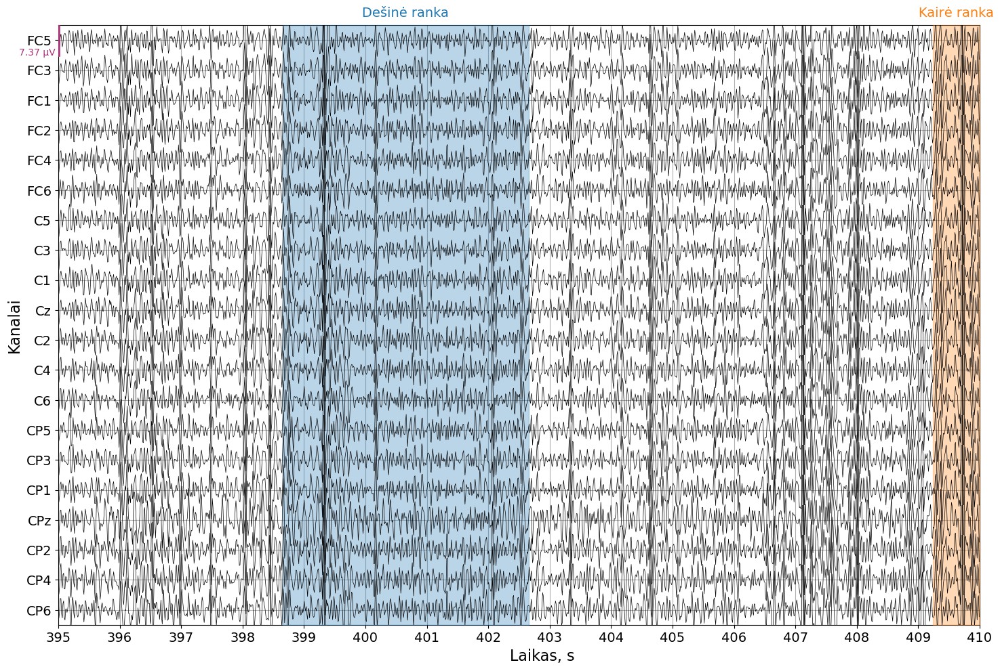

In [17]:
fig = raw_clean.plot(start=395, duration=15,
    picks=[
        'FC5', 'FC3', 'FC1', 'FC2', 'FC4', 'FC6',
        'C5', 'C3', 'C1', 'Cz', 'C2', 'C4', 'C6',
        'CP5', 'CP3', 'CP1', 'CPz', 'CP2', 'CP4', 'CP6'
    ],
    show=False,
    block=False,
    scalings='auto')

# Change the figure size
fig.set_size_inches(15, 10)

ax_main = fig.axes[0]
ax_main.set_ylabel("Kanalai", fontsize=16)
ax_main.grid(True)
ax_main.tick_params(axis='both', which='major', labelsize=14)

for extra_ax in fig.axes[1:]:
    extra_ax.set_visible(False)

ax_main.text(0.525, -0.06, "Laikas, s", transform=ax_main.transAxes,
             ha='center', fontsize=16)

for txt in fig.findobj(match=plt.Text):
    current_text = txt.get_text()
    if "1" in current_text:
        txt.set_text("Dešinė ranka")
        txt.set_fontsize(14) 
    if "2" in current_text:
        txt.set_text("Kairė ranka")
        txt.set_fontsize(14)  
    if "µV" in current_text:
        txt.set_fontsize(10)

xlim = ax_main.get_xlim()
ticks = np.arange(np.floor(xlim[0]), np.ceil(xlim[1]), 1)
ax_main.set_xticks(ticks)

plt.tight_layout()
plt.show()


In [137]:
def clean_results(paths):
    evaluations = {}
    for path in paths:
        filename = os.path.basename(path)
        subject_run = filename.split('_')[-3]
        file = pd.read_pickle(path)
        if subject_run not in evaluations:
            file.pop('single_pipeline')
            evaluations[subject_run] = file
            
    records = []
    for eval_date, pipelines in evaluations.items():
        for pipeline, metrics in pipelines.items():
            # Start with top-level information.
            record = {'evaluation': eval_date, 'pipeline': pipeline}
            # Iterate over the metrics.
            for key, value in metrics.items():
                # If the value is itself a dict (e.g., nested resources), flatten it.
                if isinstance(value, dict):
                    for subkey, subvalue in value.items():
                        record[f"{key}_{subkey}"] = subvalue
                else:
                    record[key] = value
            records.append(record)

    # Create DataFrame.
    df = pd.DataFrame(records)

    metrics = ['train_accuracy', 'train_roc_auc', 'val_accuracy', 'val_roc_auc']

    # Expand each metric column: convert each list in the column into separate columns.
    for col in metrics:
        # Convert the list values into a DataFrame. Each row's list becomes a row in the new DataFrame.
        expanded = pd.DataFrame(df[col].tolist(), index=df.index)
        # Rename the new columns to include the metric name (e.g. train_accuracy_0, train_accuracy_1, ...)
        expanded = expanded.add_prefix(col + '_')
        # Drop the original list column and join the new expanded columns.
        df = df.drop(columns=[col]).join(expanded)

    # Now, to reorder the columns so that for each pass the four metrics are together:
    # First, determine the number of passes from one of the expanded metric columns.
    n_passes = df.filter(regex=r'^train_accuracy_').shape[1]

    # Collect the metric columns in the order: first pass, second pass, etc.
    ordered_metric_cols = []
    for i in range(n_passes):
        for metric in metrics:
            col_name = f"{metric}_{i}"
            if col_name in df.columns:
                ordered_metric_cols.append(col_name)

    # Get the non-expanded columns (e.g. evaluation, pipeline, etc.)
    other_cols = [col for col in df.columns if not any(col.startswith(m + '_') for m in metrics)]

    # Create the final DataFrame with the desired column order:
    # identifiers first, then the grouped metric columns.
    df = df[other_cols + ordered_metric_cols]

    df_plot = df[['evaluation', 'pipeline', 'mean_train_accuracy', 'mean_train_auc','mean_val_accuracy','mean_val_auc']]
    return df_plot

In [140]:
df_raw = clean_results(glob.glob(r'C:\Users\rokas\Documents\GitHub\BCI\mi-bci\data\results\pipeline_scores\lee2019\2025-03-31\\*.pkl'))
df_fh = clean_results(glob.glob(r'C:\Users\rokas\Documents\GitHub\BCI\mi-bci\data\results\pipeline_scores\lee2019\2025-03-31_halfs\\*fh*.pkl'))
df_sh = clean_results(glob.glob(r'C:\Users\rokas\Documents\GitHub\BCI\mi-bci\data\results\pipeline_scores\lee2019\2025-03-31_halfs\\*sh*.pkl'))


In [146]:
df_fh

,evaluation,pipeline,mean_train_accuracy,mean_train_auc,mean_val_accuracy,mean_val_auc
0,fh,CSP_SVM,0.710,0.785076,0.58,0.637000
1,fh,CSP_LR,0.640,0.690395,0.54,0.621333
2,fh,CSP_LDA,0.655,0.667362,0.52,0.516667
3,fh,CSP_RF,1.000,1.000000,0.58,0.628667
4,fh,CSSP_SVM,0.825,0.926856,0.74,0.855333
5,fh,CSSP_LR,0.815,0.893781,0.80,0.862667
6,fh,CSSP_LDA,0.800,0.880254,0.78,0.846333
7,fh,CSSP_RF,1.000,1.000000,0.70,0.823333
8,fh,BSSFO_SVM,0.700,0.813643,0.46,0.508667
9,fh,BSSFO_LR,0.775,0.870733,0.52,0.588333


In [145]:
df_raw

,evaluation,pipeline,mean_train_accuracy,mean_train_auc,mean_val_accuracy,mean_val_auc
0,01-01,CSP_SVM,0.5925,0.677000,0.49,0.454
1,01-01,CSP_LR,0.5625,0.626125,0.48,0.480
2,01-01,CSP_LDA,0.5675,0.632000,0.43,0.442
3,01-01,CSP_RF,1.0000,1.000000,0.51,0.516
4,01-01,CSSP_SVM,0.6025,0.678375,0.51,0.482
...,...,...,...,...,...,...
3739,53-02,LogVar_RF,1.0000,1.000000,0.62,0.644
3740,53-02,TS_SVM,0.9975,1.000000,0.61,0.694
3741,53-02,TS_LR,1.0000,1.000000,0.69,0.758
3742,53-02,TS_LDA,0.6850,0.727000,0.67,0.722


   Run     FBCSP       CSP
0  raw  0.926587  0.864014
1   fh  0.900000  0.727500
2   sh  0.765000  0.660000


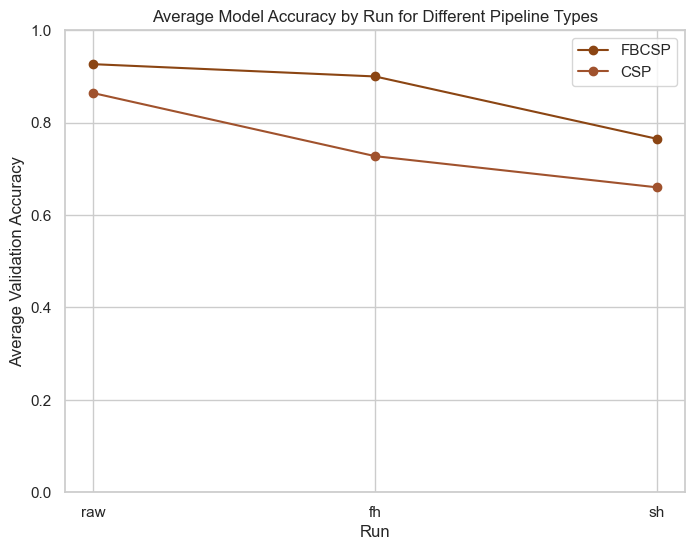

In [149]:
# Filter for pipelines
pipelines = {
    'FBCSP': 'FBCSP',
    'CSP': 'CSP'
}

# Create a dictionary to hold the average accuracies
avg_accuracies = {'Run': []}

# Initialize dictionary keys for each pipeline type
for key in pipelines:
    avg_accuracies[key] = []

# List of run names and their corresponding DataFrames
runs = {
    'raw': df_raw,
    'fh': df_fh,
    'sh': df_sh
}

# Calculate the average validation accuracy for each run and pipeline type
for run_name, df in runs.items():
    avg_accuracies['Run'].append(run_name)
    for pipeline_name, filter_str in pipelines.items():
        df_filtered = df[df['pipeline'].str.contains(filter_str, case=False)]
        avg = df_filtered['mean_val_accuracy'].mean() if not df_filtered.empty else None
        avg_accuracies[pipeline_name].append(avg)

# Convert dictionary to DataFrame
summary_df = pd.DataFrame(avg_accuracies)
print(summary_df)

# Plotting: for each pipeline type, plot the average accuracies by run.
plt.figure(figsize=(8, 6))
for pipeline_name in pipelines:
    plt.plot(summary_df['Run'], summary_df[pipeline_name], marker='o', label=pipeline_name)
    
plt.xlabel("Run")
plt.ylabel("Average Validation Accuracy")
plt.title("Average Model Accuracy by Run for Different Pipeline Types")
plt.ylim(0, 1)
plt.grid(True)
plt.legend()
plt.show()

   Run   CSP_SVM    CSP_LR   CSP_LDA   CSP_RF  CSSP_SVM   CSSP_LR  CSSP_LDA  \
0  raw  0.796731  0.806731  0.806058  0.79625  0.832788  0.834038  0.832019   
1   fh  0.580000  0.540000  0.520000  0.58000  0.740000  0.800000  0.780000   
2   sh  0.480000  0.460000  0.620000  0.66000  0.480000  0.460000  0.600000   

    CSSP_RF  BSSFO_SVM  ...  STFT_LDA   STFT_RF  LogVar_SVM  LogVar_LR  \
0  0.818173   0.719808  ...  0.567596  0.609327    0.630577   0.699038   
1  0.700000   0.460000  ...  0.440000  0.480000    0.340000   0.560000   
2  0.640000   0.480000  ...  0.500000  0.400000    0.640000   0.540000   

   LogVar_LDA  LogVar_RF    TS_SVM     TS_LR    TS_LDA     TS_RF  
0    0.607981   0.641635  0.752596  0.802981  0.669327  0.724038  
1    0.500000   0.420000  0.580000  0.820000  0.580000  0.720000  
2    0.560000   0.640000  0.480000  0.600000  0.520000  0.520000  

[3 rows x 37 columns]


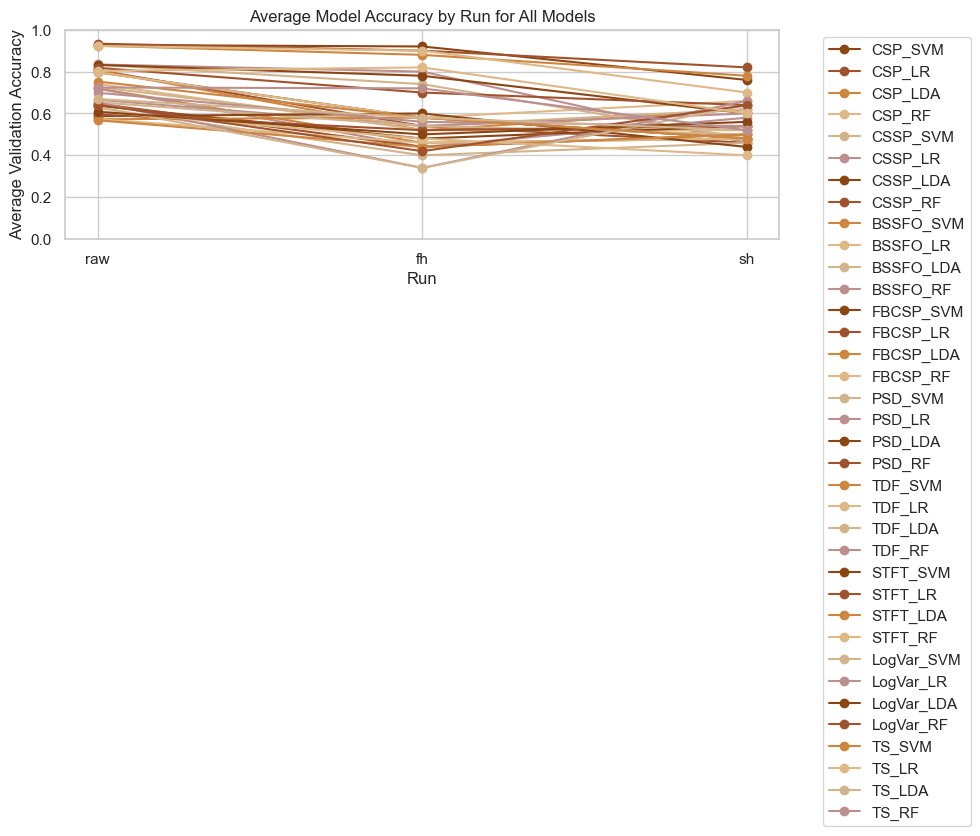

In [150]:
# Identify all unique pipelines (models) across all runs
all_models = pd.concat([df_raw, df_fh, df_sh])['pipeline'].unique()

# Prepare a dictionary to store average accuracies for each run and each model
results = {'Run': []}
for model in all_models:
    results[model] = []

# Dictionary mapping run names to their DataFrame
runs = {'raw': df_raw, 'fh': df_fh, 'sh': df_sh}

# Loop over each run and each model to compute the average validation accuracy
for run_name, df in runs.items():
    results['Run'].append(run_name)
    for model in all_models:
        # Filter rows corresponding to the current model.
        # Here we assume the 'pipeline' column contains exact model names.
        df_model = df[df['pipeline'] == model]
        if not df_model.empty:
            avg_acc = df_model['mean_val_accuracy'].mean()
        else:
            avg_acc = None  # or use np.nan if you prefer
        results[model].append(avg_acc)

# Convert the results to a DataFrame
summary_df = pd.DataFrame(results)
print(summary_df)

# Plot the average validation accuracy for each model across runs
plt.figure(figsize=(10, 6))
for model in all_models:
    plt.plot(summary_df['Run'], summary_df[model], marker='o', label=model)
    
plt.xlabel("Run")
plt.ylabel("Average Validation Accuracy")
plt.title("Average Model Accuracy by Run for All Models")
plt.ylim(0, 1)  # Accuracy is typically between 0 and 1
plt.grid(True)
plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()

In [ ]:
# Add a column to identify the run
df_raw['run'] = 'raw'
df_fh['run'] = 'fh'
df_sh['run'] = 'sh'

# Combine all runs into one DataFrame
df_all = pd.concat([df_raw, df_fh, df_sh], ignore_index=True)

# Identify unique models/pipelines
all_models = df_all['pipeline'].unique()

# For each model, perform the Kruskal–Wallis test to compare the distributions between the three runs
kruskal_results = {}
for model in all_models:
    # Extract mean_val_accuracy for each run for the current model
    raw_vals = df_all[(df_all['pipeline'] == model) & (df_all['run'] == 'raw')]['mean_val_accuracy']
    fh_vals  = df_all[(df_all['pipeline'] == model) & (df_all['run'] == 'fh')]['mean_val_accuracy']
    sh_vals  = df_all[(df_all['pipeline'] == model) & (df_all['run'] == 'sh')]['mean_val_accuracy']
    
    # Only perform test if all groups have at least one sample
    if len(raw_vals) > 0 and len(fh_vals) > 0 and len(sh_vals) > 0:
        h_val, p_val = stats.kruskal(raw_vals, fh_vals, sh_vals)
        kruskal_results[model] = (h_val, p_val)
    else:
        kruskal_results[model] = (None, None)

# Print Kruskal-Wallis results
print("Kruskal–Wallis Results (H-value, p-value) by Model:")
for model, (h_val, p_val) in kruskal_results.items():
    if h_val is not None:
        print(f"{model}: H = {h_val:.3f}, p = {p_val:.3f}")
    else:
        print(f"{model}: Not enough data for test.")

# Create box plots for each model with Kruskal–Wallis p-values annotated.
n_models = len(all_models)
ncols = 3  # Adjust columns per row as needed
nrows = (n_models + ncols - 1) // ncols

fig, axes = plt.subplots(nrows, ncols, figsize=(5*ncols, 4*nrows), squeeze=False)

for idx, model in enumerate(all_models):
    ax = axes[idx // ncols][idx % ncols]
    
    # Gather data for the box plot
    groups = []
    labels = []
    for run in ['raw', 'fh', 'sh']:
        group = df_all[(df_all['pipeline'] == model) & (df_all['run'] == run)]['mean_val_accuracy']
        groups.append(group)
        labels.append(run)
    
    # Create the box plot for the three groups
    bp = ax.boxplot(groups, positions=[1, 2, 3], widths=0.6)
    ax.set_xticks([1, 2, 3])
    ax.set_xticklabels(labels)
    ax.set_ylim(0, 1)  # Assuming accuracy is between 0 and 1
    ax.set_title(model, fontsize=10)
    ax.set_ylabel("Validation Accuracy")
    
    # Annotate with the Kruskal–Wallis p-value if available
    _, p_val = kruskal_results[model]
    if p_val is not None:
        ax.text(0.5, 0.95, f"KW p = {p_val:.3f}", transform=ax.transAxes,
                fontsize=9, verticalalignment='top', horizontalalignment='center')
    else:
        ax.text(0.5, 0.95, "Insufficient data", transform=ax.transAxes,
                fontsize=9, verticalalignment='top', horizontalalignment='center')

# Remove any unused subplots if grid is larger than needed
for j in range(idx + 1, nrows * ncols):
    fig.delaxes(axes[j // ncols][j % ncols])

plt.suptitle("Validation Accuracy by Model and Run (Kruskal–Wallis Test)", fontsize=14)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

In [142]:
df_sh

,evaluation,pipeline,mean_train_accuracy,mean_train_auc,mean_val_accuracy,mean_val_auc
0,sh,CSP_SVM,0.570,0.713951,0.48,0.575333
1,sh,CSP_LR,0.620,0.658352,0.46,0.575000
2,sh,CSP_LDA,0.645,0.708444,0.62,0.678333
3,sh,CSP_RF,1.000,1.000000,0.66,0.647000
4,sh,CSSP_SVM,0.565,0.721462,0.48,0.591000
5,sh,CSSP_LR,0.610,0.651845,0.46,0.590667
6,sh,CSSP_LDA,0.625,0.708451,0.60,0.654333
7,sh,CSSP_RF,1.000,1.000000,0.64,0.678667
8,sh,BSSFO_SVM,0.620,0.853722,0.48,0.501000
9,sh,BSSFO_LR,0.835,0.910320,0.52,0.637000


In [ ]:
df_raw = clean_results(glob.glob(r'C:\Users\rokas\Documents\GitHub\BCI\mi-bci\data\results\pipeline_scores\lee2019\2025-03-31\\*.pkl'))
df_ = clean_results(glob.glob(r'C:\Users\rokas\Documents\GitHub\BCI\mi-bci\data\results\pipeline_scores\lee2019\2025-04-04_autorej\\*.pkl'))
df_cleaned = clean_results(glob.glob(r'C:\Users\rokas\Documents\GitHub\BCI\mi-bci\data\results\pipeline_scores\lee2019\2025-04-04_cleaned\\*.pkl'))
df_cleaned_auto = clean_results(glob.glob(r'C:\Users\rokas\Documents\GitHub\BCI\mi-bci\data\results\pipeline_scores\lee2019\2025-04-04_cleaned_autorej\\*.pkl'))

In [119]:
df_raw

,evaluation,pipeline,mean_train_accuracy,mean_train_auc,mean_val_accuracy,mean_val_auc,source
0,01-01,CSP_SVM,0.5925,0.677000,0.49,0.454,df_raw
1,01-01,CSP_LR,0.5625,0.626125,0.48,0.480,df_raw
2,01-01,CSP_LDA,0.5675,0.632000,0.43,0.442,df_raw
3,01-01,CSP_RF,1.0000,1.000000,0.51,0.516,df_raw
4,01-01,CSSP_SVM,0.6025,0.678375,0.51,0.482,df_raw
...,...,...,...,...,...,...,...
3739,53-02,LogVar_RF,1.0000,1.000000,0.62,0.644,df_raw
3740,53-02,TS_SVM,0.9975,1.000000,0.61,0.694,df_raw
3741,53-02,TS_LR,1.0000,1.000000,0.69,0.758,df_raw
3742,53-02,TS_LDA,0.6850,0.727000,0.67,0.722,df_raw


One-Way ANOVA for Mean Validation Accuracy (All Models Combined):
F-statistic: 9.175721597872919
p-value: 4.6187476130607045e-06

Tukey HSD Post-hoc Test Results:
         Multiple Comparison of Means - Tukey HSD, FWER=0.05         
     group1          group2     meandiff p-adj   lower  upper  reject
---------------------------------------------------------------------
        df_auto      df_cleaned  -0.0059 0.3953 -0.0156 0.0038  False
        df_auto df_cleaned_auto  -0.0011 0.9906 -0.0108 0.0086  False
        df_auto          df_raw   0.0128 0.0037  0.0032 0.0225   True
     df_cleaned df_cleaned_auto   0.0048 0.5781 -0.0048 0.0144  False
     df_cleaned          df_raw   0.0187    0.0  0.0091 0.0283   True
df_cleaned_auto          df_raw    0.014 0.0011  0.0043 0.0236   True
---------------------------------------------------------------------


C:\Users\rokas\AppData\Local\Temp\ipykernel_26932\1439316846.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


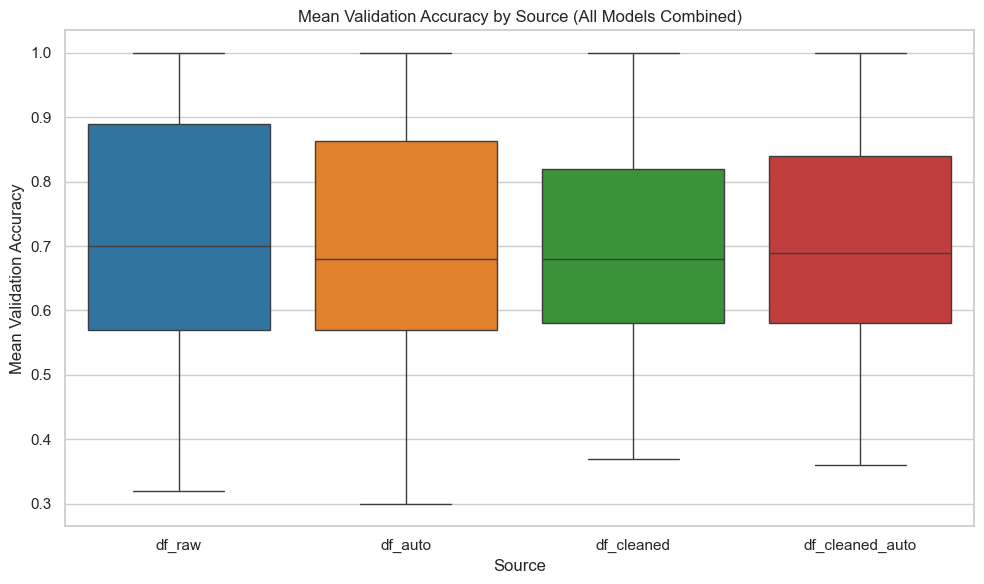

In [123]:
import pandas as pd
import scipy.stats as stats
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import matplotlib.pyplot as plt
import seaborn as sns

# --- Step 1: Data Preparation ---
# Ensure that each DataFrame has a 'source' column if not already present.
df_raw['source'] = 'df_raw'
df_auto['source'] = 'df_auto'
df_cleaned['source'] = 'df_cleaned'
df_cleaned_auto['source'] = 'df_cleaned_auto'

# Combine all dataframes into one
df_all = pd.concat([df_raw, df_auto, df_cleaned, df_cleaned_auto], ignore_index=True)

# Note: We are not filtering by a specific pipeline, so we include all models.

# --- Step 2: One-Way ANOVA on Mean Validation Accuracy ---
# Extract the mean validation accuracy for each source across all pipelines.
groups = [df_all[df_all['source'] == src]['mean_val_accuracy'] 
          for src in ['df_raw', 'df_auto', 'df_cleaned', 'df_cleaned_auto']]

anova_result = stats.f_oneway(*groups)
print("One-Way ANOVA for Mean Validation Accuracy (All Models Combined):")
print("F-statistic:", anova_result.statistic)
print("p-value:", anova_result.pvalue)

# --- Step 3: Post-hoc Pairwise Comparisons with Tukey HSD ---
tukey_result = pairwise_tukeyhsd(
    endog=df_all['mean_val_accuracy'],  # The metric to compare
    groups=df_all['source'],            # Groups (sources)
    alpha=0.05
)
print("\nTukey HSD Post-hoc Test Results:")
print(tukey_result.summary())

# --- Step 4: Visualize the Differences ---
plt.figure(figsize=(10, 6))
sns.boxplot(
    x='source', 
    y='mean_val_accuracy', 
    data=df_all, 
    palette={
        'df_raw': '#1f77b4',      
        'df_auto': '#ff7f0e',     
        'df_cleaned': '#2ca02c',  
        'df_cleaned_auto': '#d62728'
    }
)
plt.title("Mean Validation Accuracy by Source (All Models Combined)")
plt.xlabel("Source")
plt.ylabel("Mean Validation Accuracy")
plt.tight_layout()
plt.show()


Mean Scores by Source:
            source  mean_train_accuracy  mean_train_auc  mean_val_accuracy  \
0          df_auto             0.950403        0.983462           0.921791   
1       df_cleaned             0.890601        0.946672           0.847019   
2  df_cleaned_auto             0.917364        0.963465           0.877104   
3           df_raw             0.956226        0.983552           0.933462   

   mean_val_auc  
0      0.967589  
1      0.910096  
2      0.933851  
3      0.970135  


C:\Users\rokas\AppData\Local\Temp\ipykernel_26932\2509059007.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


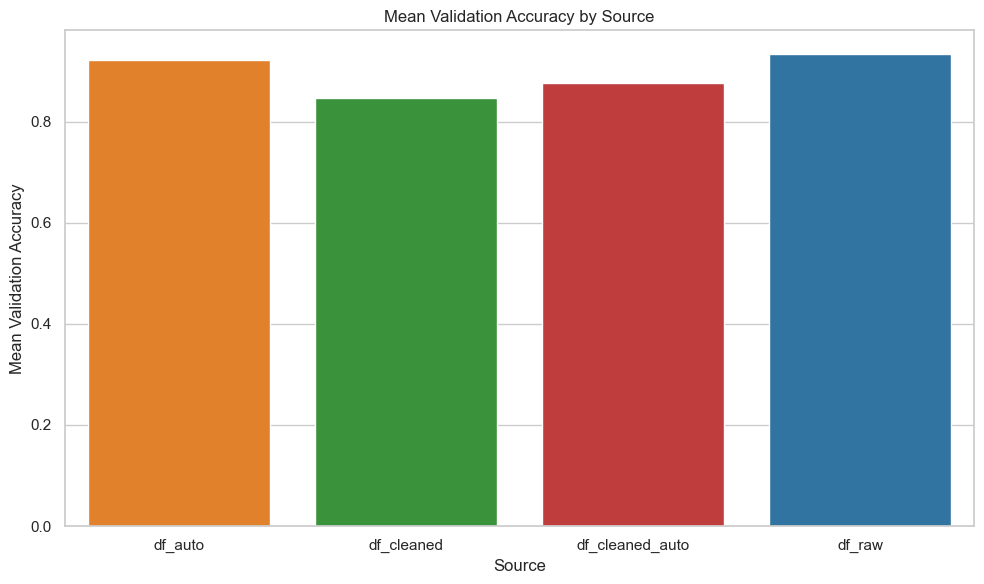

In [121]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# --- Assuming the dataframes have been loaded and combined as in the previous snippet ---
# Also assuming each dataframe already has a "source" column.
# Here is a reminder of the combination and filtering steps:

# df_raw['source'] = 'df_raw'
# df_auto['source'] = 'df_auto'
# df_cleaned['source'] = 'df_cleaned'
# df_cleaned_auto['source'] = 'df_cleaned_auto'
# df_all = pd.concat([df_raw, df_auto, df_cleaned, df_cleaned_auto], ignore_index=True)
# Filter for the FBCSP_LR pipeline
df_pipeline = df_all[df_all['pipeline'] == 'FBCSP_LR'].copy()

# --- Compute Mean Scores by Source ---
mean_scores = df_pipeline.groupby('source').agg({
    'mean_train_accuracy': 'mean',
    'mean_train_auc': 'mean',
    'mean_val_accuracy': 'mean',
    'mean_val_auc': 'mean'
}).reset_index()

print("Mean Scores by Source:")
print(mean_scores)

# --- Optional: Plotting Mean Validation Accuracy for Comparison ---
# Define a palette for consistency with the previous visualization.
base_palette = {
    'df_raw': '#1f77b4',      
    'df_auto': '#ff7f0e',     
    'df_cleaned': '#2ca02c',  
    'df_cleaned_auto': '#d62728'   
}

plt.figure(figsize=(10, 6))
sns.barplot(
    x='source', 
    y='mean_val_accuracy', 
    data=mean_scores, 
    palette=base_palette
)
plt.title("Mean Validation Accuracy by Source")
plt.xlabel("Source")
plt.ylabel("Mean Validation Accuracy")
plt.tight_layout()
plt.show()


In [46]:
evaluations = {}
paths = glob.glob(r'C:\Users\rokas\Documents\GitHub\BCI\mi-bci\data\results\pipeline_scores\lee2019\2025-03-31\\*.pkl')

for path in paths:
    filename = os.path.basename(path)
    subject_run = filename.split('_')[-3]
    file = pd.read_pickle(path)
    if subject_run not in evaluations:
        file.pop('single_pipeline')
        evaluations[subject_run] = file

In [57]:
import pandas as pd

records = []
for eval_date, pipelines in evaluations.items():
    for pipeline, metrics in pipelines.items():
        # Start with top-level information.
        record = {'evaluation': eval_date, 'pipeline': pipeline}
        # Iterate over the metrics.
        for key, value in metrics.items():
            # If the value is itself a dict (e.g., nested resources), flatten it.
            if isinstance(value, dict):
                for subkey, subvalue in value.items():
                    record[f"{key}_{subkey}"] = subvalue
            else:
                record[key] = value
        records.append(record)

# Create DataFrame.
df = pd.DataFrame(records)
df.head(5)

,evaluation,pipeline,train_accuracy,train_roc_auc,val_accuracy,val_roc_auc,mean_train_accuracy,mean_train_auc,mean_val_accuracy,mean_val_auc,feat_resources_used_CPU_time_used(sec),feat_resources_used_Wall-clock_time_used(sec),feat_resources_used_Memory_change(MB),class_resources_used_CPU_time_used(sec),class_resources_used_Wall-clock_time_used(sec),class_resources_used_Memory_change(MB),recourses_per_pipeline_CPU_time_used(sec),recourses_per_pipeline_Wall-clock_time_used(sec),recourses_per_pipeline_Memory_change(MB)
0,01-01,CSP_SVM,"[0.5625, 0.6125, 0.575, 0.575, 0.6375]","[0.666875, 0.670625, 0.69, 0.7168749999999999,...","[0.5, 0.45, 0.5, 0.5, 0.5]","[0.36, 0.47, 0.54, 0.45999999999999996, 0.44]",0.5925,0.677000,0.49,0.454,17.734375,2.728774,38.441406,0.984375,3.969573,0.640625,18.718750,6.698346,39.082031
1,01-01,CSP_LR,"[0.5125, 0.5625, 0.5375, 0.6, 0.6]","[0.6237499999999999, 0.605625, 0.6075, 0.63312...","[0.45, 0.45, 0.5, 0.6, 0.4]","[0.34, 0.5399999999999999, 0.55, 0.53, 0.43999...",0.5625,0.626125,0.48,0.480,17.734375,2.728774,38.441406,0.015625,2.464686,0.027344,17.750000,5.193460,38.468750
2,01-01,CSP_LDA,"[0.5625, 0.5875, 0.55, 0.5625, 0.575]","[0.6218750000000001, 0.615625, 0.60625, 0.6500...","[0.35, 0.4, 0.5, 0.55, 0.35]","[0.35, 0.45, 0.56, 0.49, 0.36]",0.5675,0.632000,0.43,0.442,17.734375,2.728774,38.441406,0.015625,2.631507,0.015625,17.750000,5.360281,38.457031
3,01-01,CSP_RF,"[1.0, 1.0, 1.0, 1.0, 1.0]","[1.0, 1.0, 1.0, 0.9999999999999999, 1.0]","[0.45, 0.5, 0.35, 0.55, 0.7]","[0.46499999999999997, 0.505, 0.435000000000000...",1.0000,1.000000,0.51,0.516,17.734375,2.728774,38.441406,0.031250,2.570566,0.007812,17.765625,5.299340,38.449219
4,01-01,CSSP_SVM,"[0.5625, 0.625, 0.5625, 0.6375, 0.625]","[0.66875, 0.659375, 0.6906249999999999, 0.7243...","[0.55, 0.45, 0.5, 0.55, 0.5]","[0.49, 0.47, 0.57, 0.42999999999999994, 0.45]",0.6025,0.678375,0.51,0.482,17.296875,6.892662,1.167969,0.203125,0.035380,0.015625,17.500000,6.928042,1.183594


In [ ]:
import pandas as pd

# Suppose df is your DataFrame after expanding the list columns.
# And assume these are the metrics we expanded.
import pandas as pd

# Suppose df is your DataFrame that has identifier columns (e.g. 'evaluation', 'pipeline') 
# and the following columns with list values:
# 'train_accuracy', 'train_roc_auc', 'val_accuracy', 'val_roc_auc'

# Define the metric columns to expand.
metrics = ['train_accuracy', 'train_roc_auc', 'val_accuracy', 'val_roc_auc']

# Expand each metric column: convert each list in the column into separate columns.
for col in metrics:
    # Convert the list values into a DataFrame. Each row's list becomes a row in the new DataFrame.
    expanded = pd.DataFrame(df[col].tolist(), index=df.index)
    # Rename the new columns to include the metric name (e.g. train_accuracy_0, train_accuracy_1, ...)
    expanded = expanded.add_prefix(col + '_')
    # Drop the original list column and join the new expanded columns.
    df = df.drop(columns=[col]).join(expanded)

# Now, to reorder the columns so that for each pass the four metrics are together:
# First, determine the number of passes from one of the expanded metric columns.
n_passes = df.filter(regex=r'^train_accuracy_').shape[1]

# Collect the metric columns in the order: first pass, second pass, etc.
ordered_metric_cols = []
for i in range(n_passes):
    for metric in metrics:
        col_name = f"{metric}_{i}"
        if col_name in df.columns:
            ordered_metric_cols.append(col_name)

# Get the non-expanded columns (e.g. evaluation, pipeline, etc.)
other_cols = [col for col in df.columns if not any(col.startswith(m + '_') for m in metrics)]

# Create the final DataFrame with the desired column order:
# identifiers first, then the grouped metric columns.
df = df[other_cols + ordered_metric_cols]

df.head(5)

,evaluation,pipeline,mean_train_accuracy,mean_train_auc,mean_val_accuracy,mean_val_auc,feat_resources_used_CPU_time_used(sec),feat_resources_used_Wall-clock_time_used(sec),feat_resources_used_Memory_change(MB),class_resources_used_CPU_time_used(sec),...,val_accuracy_2,val_roc_auc_2,train_accuracy_3,train_roc_auc_3,val_accuracy_3,val_roc_auc_3,train_accuracy_4,train_roc_auc_4,val_accuracy_4,val_roc_auc_4
0,01-01,CSP_SVM,0.5925,0.677000,0.49,0.454,17.734375,2.728774,38.441406,0.984375,...,0.50,0.540,0.5750,0.716875,0.50,0.46,0.6375,0.640625,0.50,0.440
1,01-01,CSP_LR,0.5625,0.626125,0.48,0.480,17.734375,2.728774,38.441406,0.015625,...,0.50,0.550,0.6000,0.633125,0.60,0.53,0.6000,0.660625,0.40,0.440
2,01-01,CSP_LDA,0.5675,0.632000,0.43,0.442,17.734375,2.728774,38.441406,0.015625,...,0.50,0.560,0.5625,0.650000,0.55,0.49,0.5750,0.666250,0.35,0.360
3,01-01,CSP_RF,1.0000,1.000000,0.51,0.516,17.734375,2.728774,38.441406,0.031250,...,0.35,0.435,1.0000,1.000000,0.55,0.46,1.0000,1.000000,0.70,0.715
4,01-01,CSSP_SVM,0.6025,0.678375,0.51,0.482,17.296875,6.892662,1.167969,0.203125,...,0.50,0.570,0.6375,0.724375,0.55,0.43,0.6250,0.648750,0.50,0.450


In [64]:
df.columns

Index(['evaluation', 'pipeline', 'mean_train_accuracy', 'mean_train_auc',
       'mean_val_accuracy', 'mean_val_auc',
       'feat_resources_used_CPU_time_used(sec)',
       'feat_resources_used_Wall-clock_time_used(sec)',
       'feat_resources_used_Memory_change(MB)',
       'class_resources_used_CPU_time_used(sec)',
       'class_resources_used_Wall-clock_time_used(sec)',
       'class_resources_used_Memory_change(MB)',
       'recourses_per_pipeline_CPU_time_used(sec)',
       'recourses_per_pipeline_Wall-clock_time_used(sec)',
       'recourses_per_pipeline_Memory_change(MB)', 'train_accuracy_0',
       'train_roc_auc_0', 'val_accuracy_0', 'val_roc_auc_0',
       'train_accuracy_1', 'train_roc_auc_1', 'val_accuracy_1',
       'val_roc_auc_1', 'train_accuracy_2', 'train_roc_auc_2',
       'val_accuracy_2', 'val_roc_auc_2', 'train_accuracy_3',
       'train_roc_auc_3', 'val_accuracy_3', 'val_roc_auc_3',
       'train_accuracy_4', 'train_roc_auc_4', 'val_accuracy_4',
       'val_roc_

In [ ]:
df_plot = df[['evaluation', 'pipeline', 'mean_train_accuracy', 'mean_train_auc','mean_val_accuracy','mean_val_auc']]

In [66]:
df_plot

,evaluation,pipeline,mean_train_accuracy,mean_train_auc,mean_val_accuracy,mean_val_auc
0,01-01,CSP_SVM,0.5925,0.677000,0.49,0.454
1,01-01,CSP_LR,0.5625,0.626125,0.48,0.480
2,01-01,CSP_LDA,0.5675,0.632000,0.43,0.442
3,01-01,CSP_RF,1.0000,1.000000,0.51,0.516
4,01-01,CSSP_SVM,0.6025,0.678375,0.51,0.482
...,...,...,...,...,...,...
3739,53-02,LogVar_RF,1.0000,1.000000,0.62,0.644
3740,53-02,TS_SVM,0.9975,1.000000,0.61,0.694
3741,53-02,TS_LR,1.0000,1.000000,0.69,0.758
3742,53-02,TS_LDA,0.6850,0.727000,0.67,0.722


C:\Users\rokas\AppData\Local\Temp\ipykernel_26932\2059703661.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_plot['feature_extraction'] = df_plot['pipeline'].str.split('_').str[0]
C:\Users\rokas\AppData\Local\Temp\ipykernel_26932\2059703661.py:10: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mean_per_pipeline = df_plot.groupby("pipeline")["mean_val_accuracy"].mean().sort_values(ascending=False)
C:\Users\rokas\AppData\Local\Temp\ipykernel_26932\2059703661.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

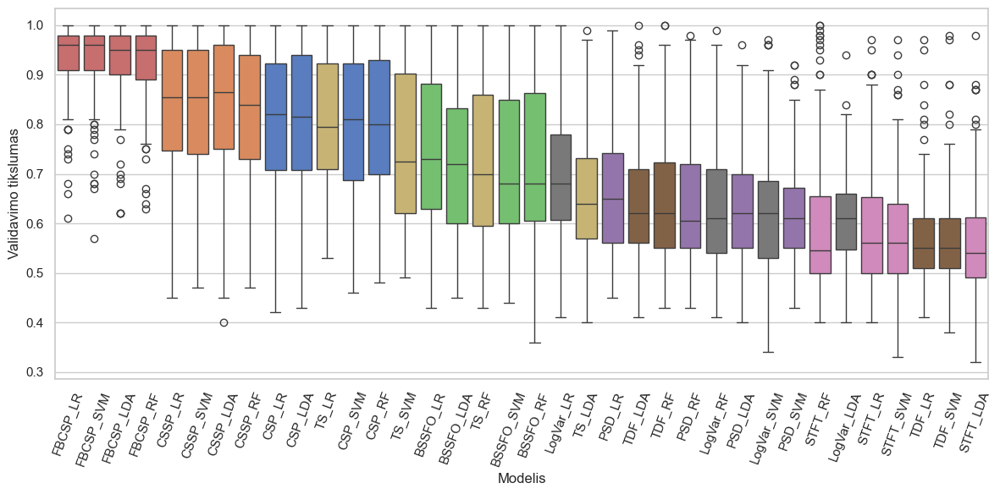

In [127]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Extract feature extraction method from the 'pipeline' column.
# Assumes the format 'FeatureExtraction_Classifier'
df_plot['feature_extraction'] = df_plot['pipeline'].str.split('_').str[0]

# Compute overall mean per pipeline and sort in descending order.
mean_per_pipeline = df_plot.groupby("pipeline")["mean_val_accuracy"].mean().sort_values(ascending=False)

# Make 'pipeline' a categorical with the desired order.
df_plot["pipeline"] = pd.Categorical(
    df_plot["pipeline"],
    categories=mean_per_pipeline.index,
    ordered=True
)

# Get the unique feature extraction methods.
unique_features = df_plot['feature_extraction'].unique()

# Create a pastel palette for the feature extraction methods.
feature_palette = dict(zip(unique_features, sns.color_palette("muted", n_colors=len(unique_features))))

# Map each pipeline to a color based on its feature extraction method.
pipeline_palette = {pipeline: feature_palette[pipeline.split('_')[0]] for pipeline in mean_per_pipeline.index}

# Create the boxplot using the mapped palette.
plt.figure(figsize=(12, 6))
ax = sns.boxplot(x='pipeline', y='mean_val_accuracy', data=df_plot, palette=pipeline_palette)
plt.xticks(rotation=70)
ax.set_xlabel("Modelis", fontsize=12)         # Rename x-axis
ax.set_ylabel("Validavimo tikslumas", fontsize=12)  # Rename y-axis
plt.tight_layout()
plt.show()


In [2]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Extract feature extraction method from the 'pipeline' column.
df_plot['feature_extraction'] = df_plot['pipeline'].str.split('_').str[0]

# Compute the median validation accuracy per pipeline and sort in descending order.
median_per_pipeline = df_plot.groupby("pipeline")["mean_val_accuracy"].median().sort_values(ascending=False)

# Define the explicit order for the pipelines.
ordered_pipelines = median_per_pipeline.index.tolist()

# Option 1: Convert 'pipeline' to a categorical with the desired order.
df_plot["pipeline"] = pd.Categorical(
    df_plot["pipeline"],
    categories=ordered_pipelines,
    ordered=True
)

# Get the unique feature extraction methods.
unique_features = df_plot['feature_extraction'].unique()

# Create a pastel palette for the feature extraction methods.
feature_palette = dict(zip(unique_features, sns.color_palette("muted", n_colors=len(unique_features))))

# Map each pipeline to a color based on its feature extraction method.
pipeline_palette = {pipeline: feature_palette[pipeline.split('_')[0]] for pipeline in ordered_pipelines}

# Option 2: Explicitly pass the order parameter to the boxplot.
plt.figure(figsize=(12, 6))
ax = sns.boxplot(x='pipeline', y='mean_val_accuracy', data=df_plot, palette=pipeline_palette, order=ordered_pipelines)
plt.xticks(rotation=70)
ax.set_xlabel("Modelis", fontsize=12)         # Rename x-axis
ax.set_ylabel("Validavimo tikslumas", fontsize=12)  # Rename y-axis
plt.tight_layout()
plt.show()


NameError: name 'df_plot' is not defined

In [1]:
df_plot

NameError: name 'df_plot' is not defined

In [ ]:
pipeline_avg = df_plot.groupby("pipeline")["mean_val_accuracy"].mean().reset_index()


In [95]:
import pandas as pd

# Compute the average validation accuracy per pipeline
pipeline_avg = df_plot.groupby("pipeline")["mean_val_accuracy"].mean().reset_index()

# Sort the pipelines in descending order (best performing first)
pipeline_avg = pipeline_avg.sort_values(by="mean_val_accuracy", ascending=False)

# Assign a rank: 1 = best
pipeline_avg["rank"] = range(1, len(pipeline_avg) + 1)

pipeline_avg


C:\Users\rokas\AppData\Local\Temp\ipykernel_26932\1116458774.py:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  pipeline_avg = df_plot.groupby("pipeline")["mean_val_accuracy"].mean().reset_index()


,pipeline,mean_val_accuracy,rank
0,FBCSP_LR,0.933462,1
1,FBCSP_SVM,0.927212,2
2,FBCSP_LDA,0.923365,3
3,FBCSP_RF,0.922308,4
4,CSSP_LR,0.834038,5
5,CSSP_SVM,0.832788,6
6,CSSP_LDA,0.832019,7
7,CSSP_RF,0.818173,8
8,CSP_LR,0.806731,9
9,CSP_LDA,0.806058,10


In [105]:
import pandas as pd

# Compute the average validation accuracy per pipeline.
pipeline_avg = df_plot.groupby("pipeline")["mean_val_accuracy"].mean().reset_index()

# Sort the pipelines in descending order (best performing first)
pipeline_avg = pipeline_avg.sort_values(by="mean_val_accuracy", ascending=False)

# Assign a rank (1 = best) for reference (this rank is for all pipelines)
pipeline_avg["rank"] = range(1, len(pipeline_avg) + 1)

# Extract feature extraction method and classifier from the pipeline names.
# Assuming each pipeline is named in the format "FEATURE_CLASSIFIER"
pipeline_avg["feature_extraction"] = pipeline_avg["pipeline"].apply(lambda x: x.split("_")[0])
pipeline_avg["classifier"] = pipeline_avg["pipeline"].apply(lambda x: x.split("_")[1])

# For each feature extraction method, keep only the pipeline with the highest mean validation accuracy.
best_pipeline_per_feature = pipeline_avg.loc[pipeline_avg.groupby("feature_extraction")["mean_val_accuracy"].idxmax()]

# Now sort the best pipelines by their mean validation accuracy in descending order and assign a new rank.
best_pipeline_per_feature = best_pipeline_per_feature.sort_values(by="mean_val_accuracy", ascending=False)
best_pipeline_per_feature["feature_rank"] = range(1, len(best_pipeline_per_feature) + 1)

best_pipeline_per_feature


C:\Users\rokas\AppData\Local\Temp\ipykernel_26932\3981429061.py:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  pipeline_avg = df_plot.groupby("pipeline")["mean_val_accuracy"].mean().reset_index()


,pipeline,mean_val_accuracy,rank,feature_extraction,classifier,feature_rank
0,FBCSP_LR,0.933462,1,FBCSP,LR,1
4,CSSP_LR,0.834038,5,CSSP,LR,2
8,CSP_LR,0.806731,9,CSP,LR,3
10,TS_LR,0.802981,11,TS,LR,4
14,BSSFO_LR,0.741635,15,BSSFO,LR,5
19,LogVar_LR,0.699038,20,LogVar,LR,6
21,PSD_LR,0.665673,22,PSD,LR,7
22,TDF_LDA,0.653654,23,TDF,LDA,8
29,STFT_RF,0.609327,30,STFT,RF,9


In [101]:
import pandas as pd

# Make a copy of your DataFrame
df = df_plot.copy()

# Extract feature extraction method and classifier from the pipeline names.
# Assuming pipeline names are of the form "FEATURE_CLASSIFIER".
df["feature_extraction"] = df["pipeline"].apply(lambda x: x.split("_")[0])
df["classifier"] = df["pipeline"].apply(lambda x: x.split("_")[1])

# --- Rank Feature Extraction Methods ---
# Compute the average metrics for each feature extraction method.
feature_avg = df.groupby("feature_extraction").agg({
    "mean_train_accuracy": "mean",
    "mean_train_auc": "mean",
    "mean_val_accuracy": "mean",
    "mean_val_auc": "mean"
}).reset_index()

# Sort by mean validation accuracy (best performance first)
feature_avg = feature_avg.sort_values(by="mean_val_accuracy", ascending=False)

# Assign ranking: 1 = best
feature_avg["rank"] = range(1, len(feature_avg) + 1)

# --- Rank Classification Algorithms ---
# Compute the average metrics for each classifier.
classifier_avg = df.groupby("classifier").agg({
    "mean_train_accuracy": "mean",
    "mean_train_auc": "mean",
    "mean_val_accuracy": "mean",
    "mean_val_auc": "mean"
}).reset_index()

# Sort by mean validation accuracy (best performance first)
classifier_avg = classifier_avg.sort_values(by="mean_val_accuracy", ascending=False)

# Assign ranking: 1 = best
classifier_avg["rank"] = range(1, len(classifier_avg) + 1)


classifier_avg


,classifier,mean_train_accuracy,mean_train_auc,mean_val_accuracy,mean_val_auc,rank
1,LR,0.889741,0.923579,0.739124,0.785754,1
2,RF,1.000000,1.000000,0.725481,0.768665,2
3,SVM,0.885849,0.928324,0.716175,0.763075,3
0,LDA,0.851611,0.902593,0.713675,0.757983,4


In [102]:
feature_avg

,feature_extraction,mean_train_accuracy,mean_train_auc,mean_val_accuracy,mean_val_auc,rank
3,FBCSP,0.967434,0.987905,0.926587,0.966392,1
2,CSSP,0.894075,0.935297,0.829255,0.883139,2
1,CSP,0.875012,0.920307,0.801442,0.860185,3
8,TS,0.921839,0.936932,0.737236,0.790103,4
0,BSSFO,0.890361,0.939166,0.726394,0.778339,5
4,LogVar,0.938768,0.973279,0.644808,0.691659,6
5,PSD,0.952356,0.975553,0.644159,0.686738,7
7,TDF,0.785787,0.827174,0.612861,0.650404,8
6,STFT,0.935571,0.952003,0.589784,0.612863,9


In [1]:
import sys
sys.path.append('c:\\Users\\rokas\\Documents\\GitHub\\BCI\\mi-bci\\code')
from helper_functions import setup_logger, load_procesed_data
from datasets import Lee2019
import os
import glob
import mne
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib.colors import TwoSlopeNorm
from mne.stats import permutation_cluster_1samp_test as pcluster_test
# from helper_functions import combine_images,add_border_and_title

log = setup_logger("Lee_preprocess")
dataset = Lee2019()

dataset_no = 20
paradigm = "MI"
subject = 33
run = 1
data = load_procesed_data(dataset_no, paradigm, subject, run, include=['epochs_raw'])

epochs = data["epochs_raw"]

vmin = -1 
vmax= 1.5# set min and max ERDS values in plot 
baseline=(-1, 0) 
tmin= -1.0
tmax= 4.0 

freqs = np.arange(8, 30)  # frequencies from 2-35Hz
event_ids = epochs.event_id  # {'left_hand': 2, 'right_hand': 1}
cnorm = TwoSlopeNorm(vmin=vmin, vcenter=0, vmax=vmax)  # min, center & max ERDS

tfr = epochs.compute_tfr(
    method="multitaper",
    freqs=freqs,
    n_cycles=freqs,
    use_fft=True,
    return_itc=False,
    average=False,
    decim=2,
    n_jobs=-1,
)

tfr.crop(
    tmin, tmax).apply_baseline(baseline, mode="percent")

df = tfr.to_data_frame(time_format=None, long_format=True)
df.head()

Reading c:\Users\rokas\Documents\GitHub\BCI\mi-bci\data\procesed\20\MI\33\1\s33.01_epochs_raw-epo.fif ...
    Found the data of interest:
        t =   -1200.00 ...    5200.00 ms
        0 CTF compensation matrices available
Not setting metadata
100 matching events found
No baseline correction applied
0 projection items activated


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:   12.6s
[Parallel(n_jobs=-1)]: Done  60 out of  62 | elapsed:   35.6s remaining:    1.1s
[Parallel(n_jobs=-1)]: Done  62 out of  62 | elapsed:   35.9s finished


Applying baseline correction (mode: percent)
Converting "condition" to "category"...
Converting "epoch" to "category"...
Converting "channel" to "category"...
Converting "ch_type" to "category"...


,condition,epoch,freq,time,channel,ch_type,value
0,left_hand,0,8.0,-1.0,Fp1,eeg,-0.240278
1,left_hand,0,8.0,-1.0,Fp2,eeg,-0.365321
2,left_hand,0,8.0,-1.0,F7,eeg,0.472741
3,left_hand,0,8.0,-1.0,F3,eeg,0.431920
4,left_hand,0,8.0,-1.0,Fz,eeg,-0.266734


In [2]:
freq_bounds = {"_": 7,"alpha": 13, "beta": 30}
df["band"] = pd.cut(
    df["freq"], list(freq_bounds.values()), labels=list(freq_bounds)[1:]
)
df = df.dropna()


In [3]:
df

,condition,epoch,freq,time,channel,ch_type,value,band
0,left_hand,0,8.0,-1.0,Fp1,eeg,-0.240278,alpha
1,left_hand,0,8.0,-1.0,Fp2,eeg,-0.365321,alpha
2,left_hand,0,8.0,-1.0,F7,eeg,0.472741,alpha
3,left_hand,0,8.0,-1.0,F3,eeg,0.431920,alpha
4,left_hand,0,8.0,-1.0,Fz,eeg,-0.266734,alpha
...,...,...,...,...,...,...,...,...
341136395,right_hand,99,29.0,4.0,AF3,eeg,-0.550060,beta
341136396,right_hand,99,29.0,4.0,AF4,eeg,-0.019091,beta
341136397,right_hand,99,29.0,4.0,AF8,eeg,-0.301582,beta
341136398,right_hand,99,29.0,4.0,PO3,eeg,1.686327,beta


In [4]:
# Filter the DataFrame to include only the desired channels
df = df[df["channel"].isin(["C3", "Cz", "C4"])].copy()

# Ensure the "channel" column is categorical and set the new categories
df["channel"] = df["channel"].astype("category")
df["channel"] = df["channel"].cat.set_categories(["C3", "Cz", "C4"], ordered=True)


In [10]:
df['condition'] = df['condition'].replace({'left_hand': 'Kairė ranka', 'right_hand': 'Dešinė ranka'})


C:\Users\rokas\AppData\Local\Temp\ipykernel_26932\1333253487.py:1: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  df['condition'] = df['condition'].replace({'left_hand': 'Kairė ranka', 'right_hand': 'Dešinė ranka'})


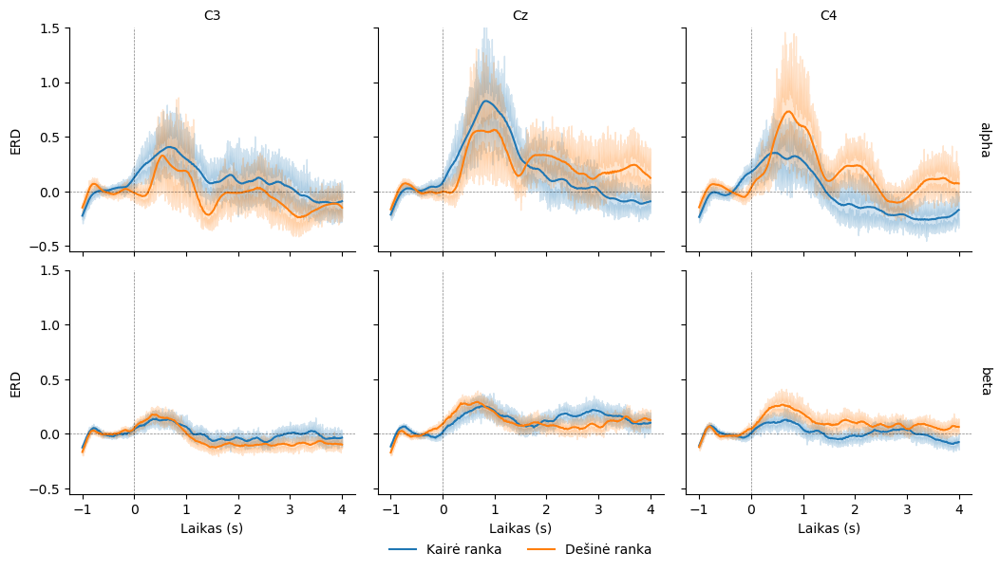

In [11]:
# Create the FacetGrid plot
g = sns.FacetGrid(df, row="band", col="channel", margin_titles=True)
g.map(sns.lineplot, "time", "value", "condition", n_boot=10)

# Add vertical and horizontal reference lines
axline_kw = dict(color="black", linestyle="dashed", linewidth=0.5, alpha=0.5)
g.map(plt.axhline, y=0, **axline_kw)
g.map(plt.axvline, x=0, **axline_kw)

# Set plot limits and labels
g.set(ylim=(None, 1.5))
g.set_axis_labels("Laikas (s)", "ERD")
g.set_titles(col_template="{col_name}", row_template="{row_name}")

# Add a legend
g.add_legend(ncol=2, loc='lower center', bbox_to_anchor=(0.5, -0.05))


# Adjust the subplot layout
g.fig.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.08)

plt.show()
plt.tight_layout()
# Close the plot to avoid memory issues with multiple plots
plt.close()


In [15]:
import pandas as pd
csv = pd.read_csv(r'C:\Users\rokas\Documents\GitHub\BCI\mi-bci\code\notebooks\lee\Cleaned_Questionnaire_results.csv')   

In [ ]:
import pandas as pd

# Load the CSV file with automatic delimiter detection
df = pd.read_csv(r'C:\Users\rokas\Documents\GitHub\BCI\mi-bci\code\notebooks\lee\Questionnaire_results.csv', encoding='utf-8', sep=None, engine='python')

# Extract meaningful question descriptions
questions = df.iloc[1:15, 1].fillna(method='ffill').tolist()

# Extract subject data
subject_data = df.loc[1:14, df.columns.str.startswith('subject')].transpose()

# Assign meaningful column names
subject_data.columns = questions

# Reset index to have subjects as rows
subject_data.reset_index(inplace=True)
subject_data.rename(columns={'index': 'Subject'}, inplace=True)

# Save cleaned data to CSV
subject_data.to_csv('Cleaned_Questionnaire_results.csv', index=False)



Data cleaning complete. Cleaned file saved as 'Cleaned_Questionnaire_results.csv'.


C:\Users\rokas\AppData\Local\Temp\ipykernel_24552\150775140.py:7: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  questions = df.iloc[1:15, 1].fillna(method='ffill').tolist()


In [16]:
csv

,Subject,Individual information,Time slot (1=9:00 / 2=12:00 / 3=15:00 / 4=18:00),Date,Age(number),Sex(male=0 / female=1),BCI experience (0=no / number=how many times),Before experiment,How long did you sleep? (1=less than 4h / 2=5~6h / 3=6~7h / 4 = 7~8 / 5= more than 8),"Did you drink coffee within the past 24 hours (0=no, number=hours before)","Did you drink alcohol within the past 24 hours (0=no, number=hours before)","Did you smoke within the past 24 hours (0=no, number=hours before)",How do you feel?,How do you feel?.1,How do you feel?.2
0,subject1,NaN,2,11/10/17,24,1,2,NaN,5,1,0,0,2,4,3
1,subject2,NaN,2,12/10/17,24,1,1,NaN,3,0,0,0,2,3,2
2,subject3,NaN,2,13/10/17,22,1,1,NaN,4,0,0,0,2,2,2
3,subject4,NaN,1,16/10/17,21,1,0,NaN,1,13,0,0,1,2,3
4,subject5,NaN,2,18/10/17,25,0,1,NaN,2,0,14,1,1,3,2
5,subject6,NaN,1,20/10/17,26,1,1,NaN,2,1,0,0,2,3,3
6,subject7,NaN,2,08/11/17,24,0,0,NaN,3,0,0,0,1,2,2
7,subject8,NaN,2,17/11/17,22,1,0,NaN,3,0,0,0,3,4,3
8,subject9,NaN,1,23/11/17,25,0,0,NaN,4,16,0,0,2,3,2
9,subject10,NaN,2,04/12/17,24,1,1,NaN,5,4,0,0,2,1,1


In [7]:
csv

,Unnamed: 0,Questionaire,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,subject1,subject2,subject3,...,subject47,subject48,subject49,subject50,subject51,subject52,subject53,subject54,Unnamed: 61,Unnamed: 62
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,Individual information,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,average,std
2,NaN,Time slot (1=9:00 / 2=12:00 / 3=15:00 / 4=18:00),NaN,NaN,NaN,NaN,NaN,2,2,2,...,1,2,4,3,2,1,2,3,2.037,0.672
3,NaN,Date,NaN,NaN,NaN,NaN,NaN,11/10/17,12/10/17,13/10/17,...,14/04/18,16/04/18,31/10/17,18/04/18,24/10/17,23/10/17,09/02/18,17/04/18,NaN,NaN
4,NaN,Age(number),NaN,NaN,NaN,NaN,NaN,24,24,22,...,29,27,25,19,28,32,25,23,24.241,3.046
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
120,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
121,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
122,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Vizualus įvertinimas

In [1]:
import sys
sys.path.append('c:\\Users\\rokas\\Documents\\Github\\BCI\\mi-bci\\code')
from helper_functions import setup_logger
from helper_functions.data_procesing.mi_procesing import process_mi_raw

from datasets import Lee2019

log = setup_logger("Lee_preprocess")

dataset = Lee2019()

subject = 10
run = 1
paradigm = "MI"
tmin = -1.2
tmax = 5.2
event_id = dict(left_hand=2, right_hand=1)

In [76]:
raw_fif = dataset.load_one_raw_fif(subject=subject, run=run, paradigm=paradigm)
raw_fif = process_mi_raw(raw_fif)

Opening raw data file c:\Users\rokas\Documents\GitHub\BCI\mi-bci\data\raw_fif\20\MI\s10.01_raw.fif...
    Range : 0 ... 1521879 =      0.000 ...  1521.879 secs
Ready.
Reading 0 ... 1521879  =      0.000 ...  1521.879 secs...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 8 - 30 Hz

IIR filter parameters
---------------------
Butterworth bandpass zero-phase (two-pass forward and reverse) non-causal filter:
- Filter order 20 (effective, after forward-backward)
- Cutoffs at 8.00, 30.00 Hz: -6.02, -6.02 dB



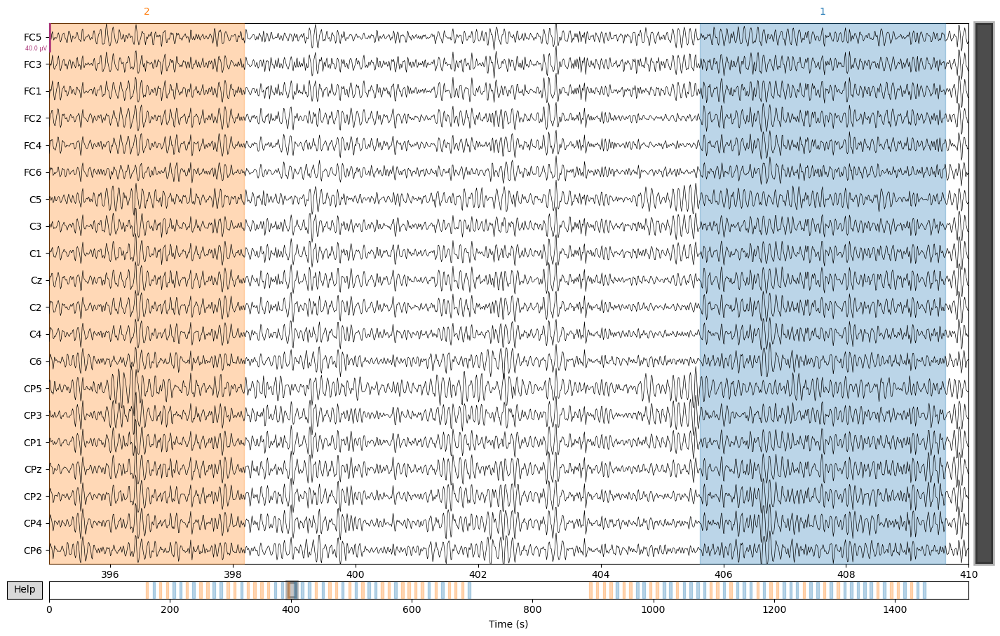

In [79]:
import matplotlib.pyplot as plt

# Plot the data but don't show it immediately
fig = raw_fif.plot(start=395, duration=15,
    picks=[
        'FC5', 'FC3', 'FC1', 'FC2', 'FC4', 'FC6',
        'C5', 'C3', 'C1', 'Cz', 'C2', 'C4', 'C6',
        'CP5', 'CP3', 'CP1', 'CPz', 'CP2', 'CP4', 'CP6'
    ],
    title='EEG Data Segment (10–20 s)',
    show=False,
    block=False)

# Change the figure size (width, height in inches)
fig.set_size_inches(15, 9)

plt.show()


2025-03-30 21:13:22,154 - Lee2019 - INFO - Loaded mat for 10 subject, 1 session


100 events found on stim channel STI 014
Event IDs: [1 2]


2025-03-30 21:13:23,403 - Lee2019 - INFO - Added anotations to raw
2025-03-30 21:13:38,057 - Lee2019 - INFO - Loaded mat for 10 subject, 2 session


100 events found on stim channel STI 014
Event IDs: [1 2]


2025-03-30 21:13:38,722 - Lee2019 - INFO - Added anotations to raw


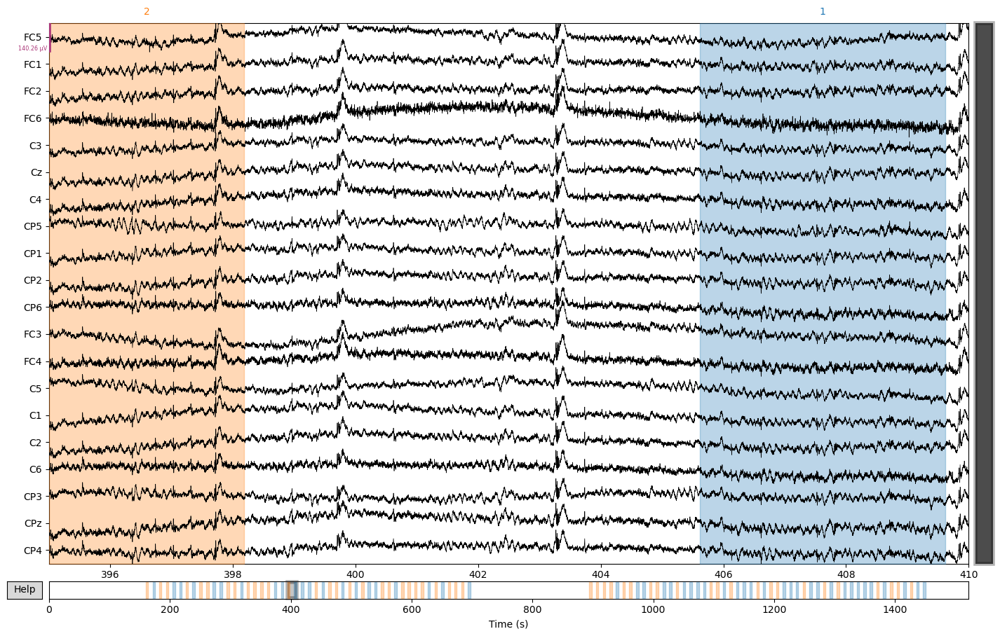

In [63]:
raw = dataset._get_single_subject_data(subject=subject)
raw = raw['0']['1train']


2025-03-31 07:50:32,671 - Lee2019 - INFO - Loaded mat for 10 subject, 1 session


100 events found on stim channel STI 014
Event IDs: [1 2]


2025-03-31 07:50:33,768 - Lee2019 - INFO - Added anotations to raw
2025-03-31 07:50:50,096 - Lee2019 - INFO - Loaded mat for 10 subject, 2 session


100 events found on stim channel STI 014
Event IDs: [1 2]


2025-03-31 07:50:50,686 - Lee2019 - INFO - Added anotations to raw


In [66]:
help(raw.compute_psd())

Effective window size : 2.048 (s)
Help on Spectrum in module mne.time_frequency.spectrum object:

class Spectrum(BaseSpectrum)
 |  Spectrum(inst, method, fmin, fmax, tmin, tmax, picks, exclude, proj, remove_dc, reject_by_annotation, *, n_jobs, verbose=None, **method_kw)
 |  
 |  Data object for spectral representations of continuous data.
 |  
 |  .. warning:: The preferred means of creating Spectrum objects from
 |               continuous or averaged data is via the instance methods
 |               :meth:`mne.io.Raw.compute_psd` or
 |               :meth:`mne.Evoked.compute_psd`. Direct class instantiation
 |               is not supported.
 |  
 |  Parameters
 |  ----------
 |  inst : instance of Raw or Evoked
 |      The data from which to compute the frequency spectrum.
 |  
 |  method : ``'welch'`` | ``'multitaper'`` | ``'auto'``
 |      Spectral estimation method. ``'welch'`` uses Welch's
 |      method :footcite:p:`Welch1967`, ``'multitaper'`` uses DPSS
 |      tapers :footcit

Effective window size : 2.048 (s)
Plotting power spectral density (dB=True).


c:\Users\rokas\Documents\GitHub\BCI\mi-bci\.pixi\envs\default\lib\site-packages\mne\viz\utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


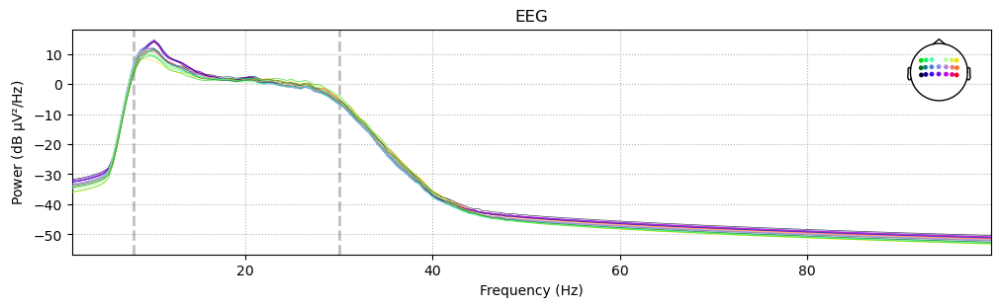

In [89]:
# Spectrum(inst, method, fmin, fmax, tmin, tmax, picks, exclude, proj, remove_dc, reject_by_annotation, *, n_jobs, verbose=None, **method_kw)
fig.set_size_inches(15, 9)

# fig = raw.compute_psd(fmin=1,fmax=100).plot()
fig = raw_fif.compute_psd(fmin=1,fmax=100).plot()

fig.set_size_inches(10, 3)
plt.show()


Effective window size : 2.048 (s)
Plotting power spectral density (dB=True).


c:\Users\rokas\Documents\GitHub\BCI\mi-bci\.pixi\envs\default\lib\site-packages\mne\viz\utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


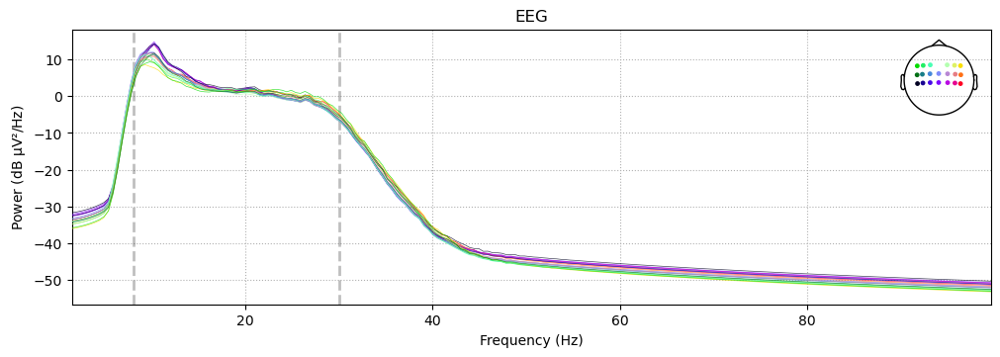

In [80]:
raw_fif.compute_psd(fmin=1,fmax=100).plot()

Effective window size : 2.048 (s)
Plotting power spectral density (dB=True).
Effective window size : 2.048 (s)
Plotting power spectral density (dB=True).


C:\Users\rokas\AppData\Local\Temp\ipykernel_44020\2637795851.py:16: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
C:\Users\rokas\AppData\Local\Temp\ipykernel_44020\2637795851.py:16: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


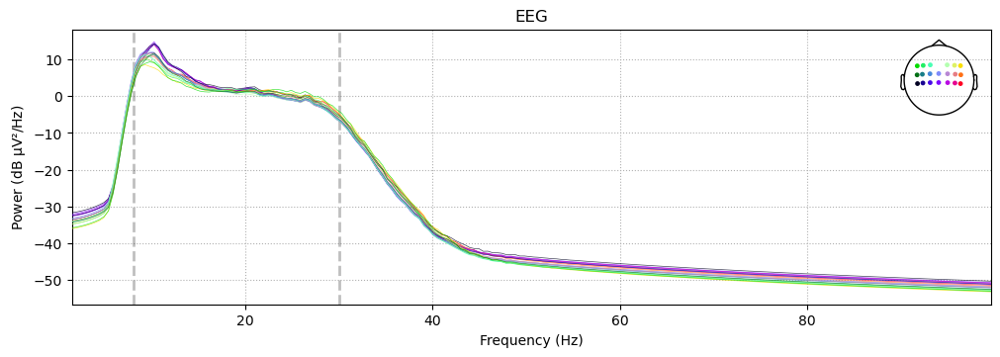

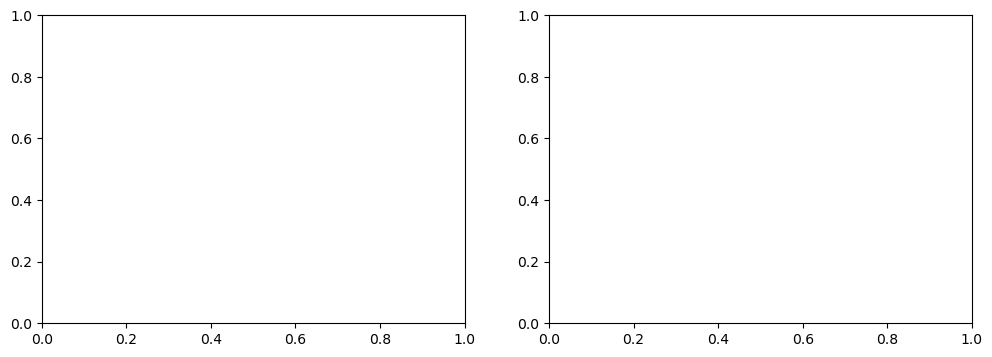

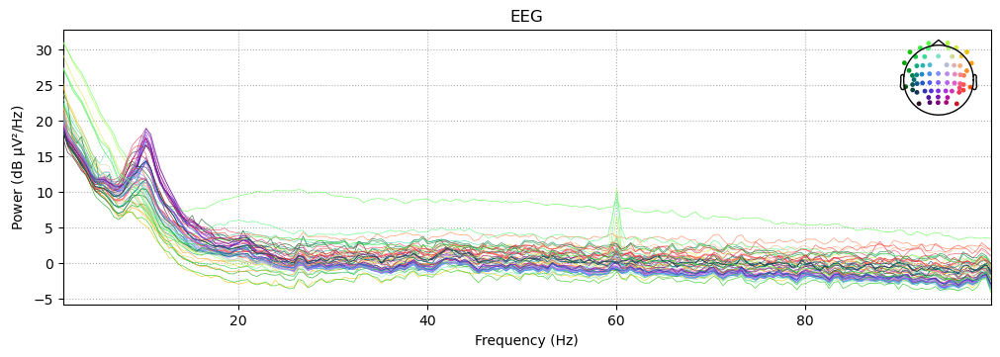

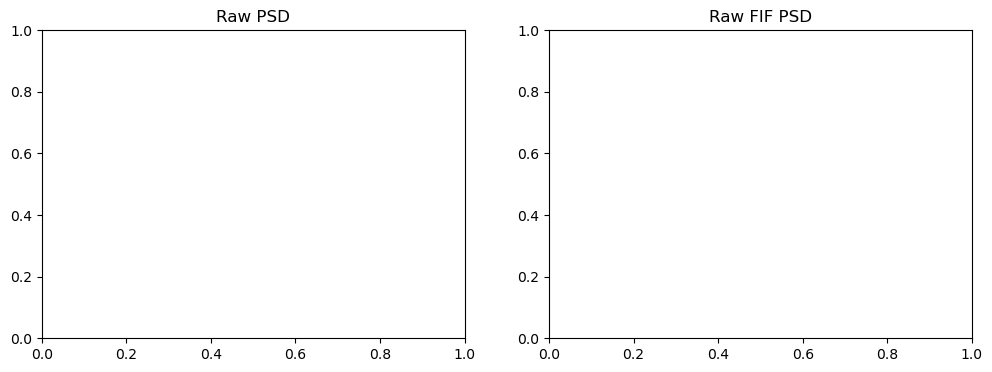

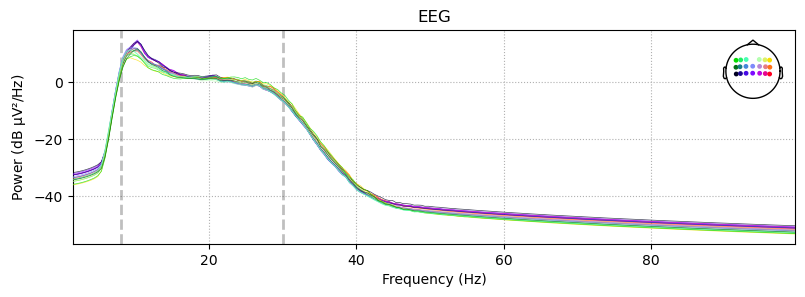

In [82]:
import matplotlib.pyplot as plt

# Create a figure with two subplots
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

# Plot the first PSD on the left subplot
plt.sca(axes[0])
raw.compute_psd(fmin=1, fmax=100).plot(show=False)
axes[0].set_title('Raw PSD')

# Plot the second PSD on the right subplot
plt.sca(axes[1])
raw_fif.compute_psd(fmin=1, fmax=100).plot(show=False)
axes[1].set_title('Raw FIF PSD')

plt.tight_layout()
plt.show()


Opening raw data file c:\Users\rokas\Documents\GitHub\BCI\mi-bci\data\raw_fif\20\MI\s10.01_raw.fif...
    Range : 0 ... 1521879 =      0.000 ...  1521.879 secs
Ready.
Reading 0 ... 1521879  =      0.000 ...  1521.879 secs...


Using matplotlib as 2D backend.


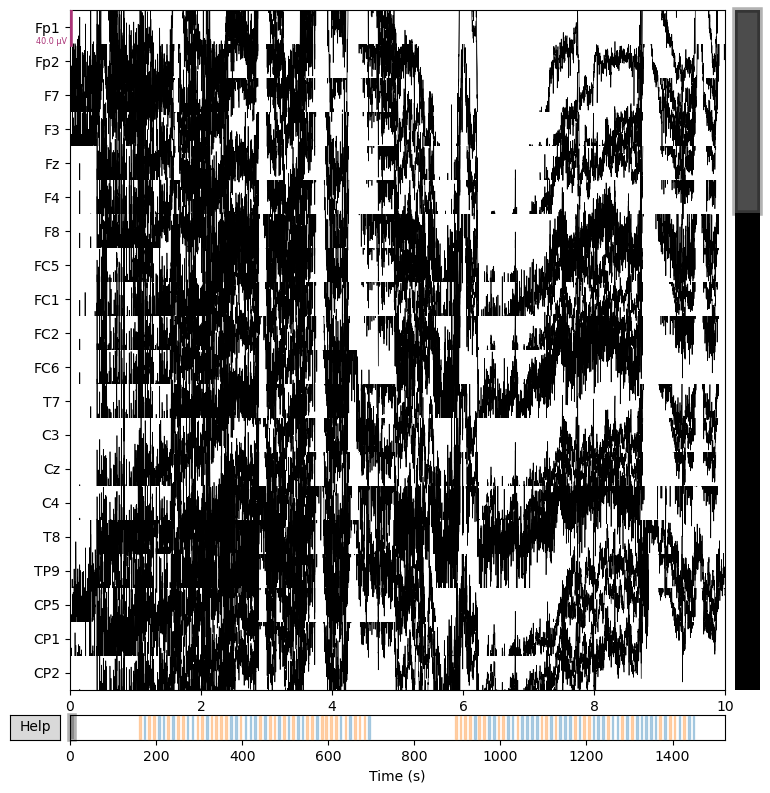

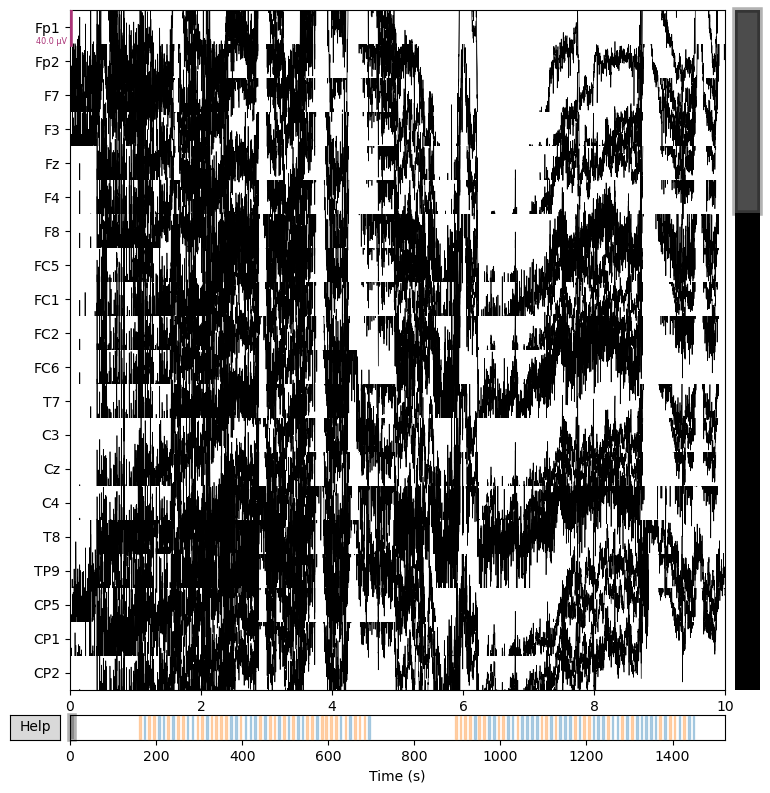

In [3]:
raw.plot()

In [ ]:
import matplotlib.pyplot as plt

import mne
from mne import io
from mne.datasets import sample
from mne.minimum_norm import compute_source_psd, read_inverse_operator

raw = raw['0']['1train']
events_raw = mne.find_events(raw) # Find events (triggers) in the data


# picks MEG gradiometers
# picks = mne.pick_types(
#     raw.info, eeg=True, stim=False, exclude="bads"
# )

tmin, tmax = 0, 120  # use the first 120s of data
fmin, fmax = 1, 100  # look at frequencies between 4 and 100Hz
n_fft = 2048  # the FFT size (n_fft). Ideally a power of 2

stc = compute_source_psd(
    raw,
    lambda2=1.0 / 9.0,
    method="dSPM",
    inverse_operator = 
    tmin=tmin,
    tmax=tmax,
    fmin=fmin,
    fmax=fmax,
    pick_ori="normal",
    n_fft=n_fft,
    dB=True,
)

# stc.save("psd_dSPM", overwrite=True)

plt.plot(stc.times, stc.data.T)
plt.xlabel("Frequency (Hz)")
plt.ylabel("PSD (dB)")
plt.title("Source Power Spectrum (PSD)")
plt.show()

100 events found on stim channel STI 014
Event IDs: [1 2]


TypeError: compute_source_psd() missing 1 required positional argument: 'inverse_operator'

In [ ]:
help(raw.plot)

Help on method plot in module mne.io.base:

plot(events=None, duration=10.0, start=0.0, n_channels=20, bgcolor='w', color=None, bad_color='lightgray', event_color='cyan', scalings=None, remove_dc=True, order=None, show_options=False, title=None, show=True, block=False, highpass=None, lowpass=None, filtorder=4, clipping=1.5, show_first_samp=False, proj=True, group_by='type', butterfly=False, decim='auto', noise_cov=None, event_id=None, show_scrollbars=True, show_scalebars=True, time_format='float', precompute=None, use_opengl=None, *, picks=None, theme=None, overview_mode=None, splash=True, verbose=None) method of mne.io.fiff.raw.Raw instance
    Plot raw data.
    
    Parameters
    ----------
    events : array | None
        Events to show with vertical bars.
    duration : float
        Time window (s) to plot. The lesser of this value and the duration
        of the raw file will be used.
    start : float
        Initial time to show (can be changed dynamically once plotted). If


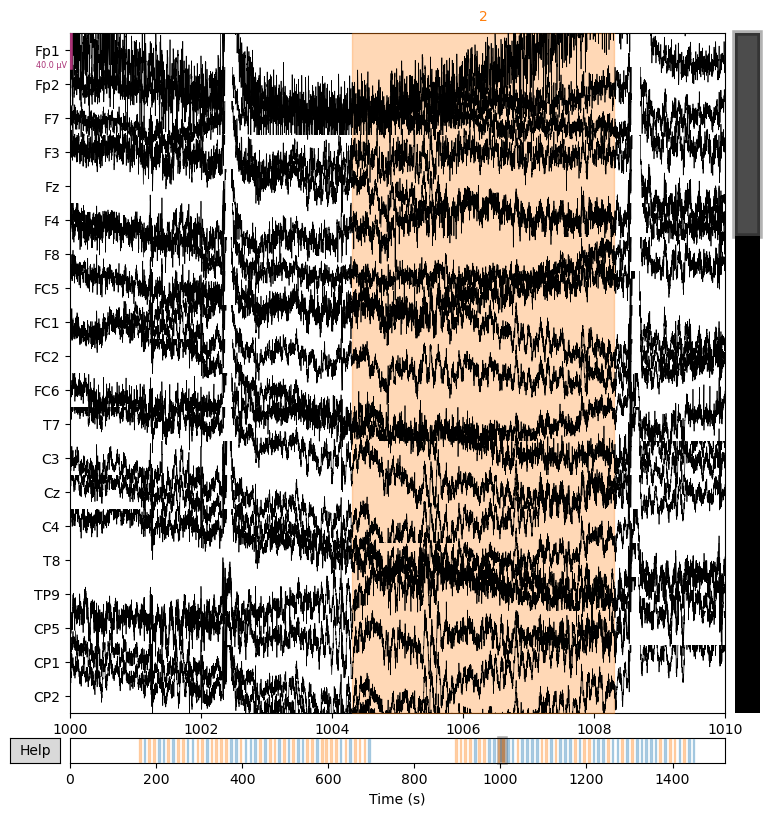

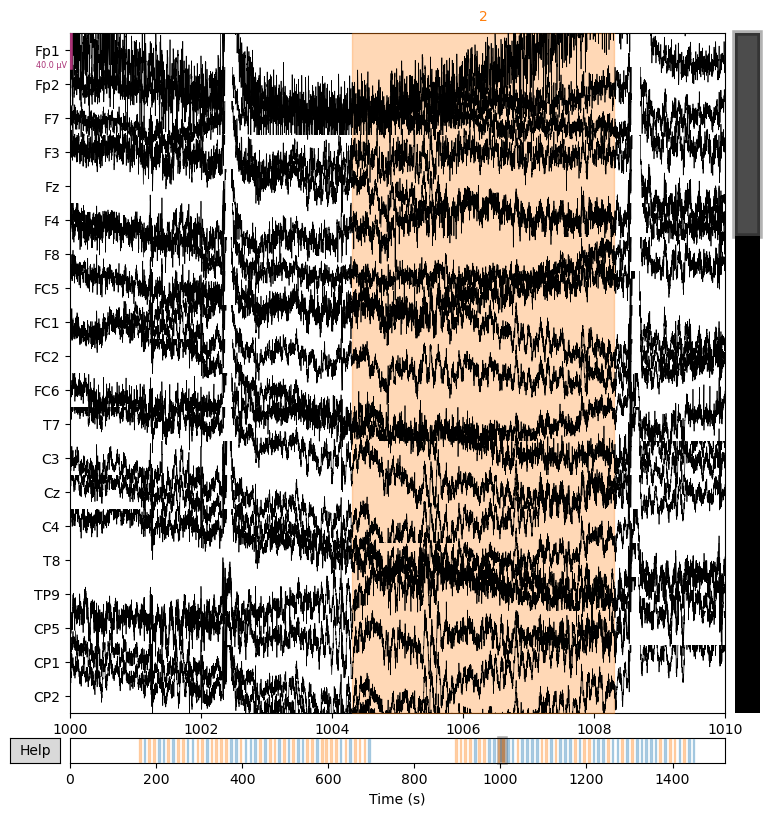

In [13]:
raw.plot(start=1000.0)

In [1]:
### Auto Preprocesingo išbandymas 

import sys
sys.path.append('c:\\Users\\rokas\\Documents\\Github\\BCI\\mi-bci\\code')
from helper_functions import preprocess_raw, setup_logger
from datasets import Lee2019

log = setup_logger("Lee_preprocess")

dataset = Lee2019()

subject = 1
run = 1
paradigm = "MI"
tmin = -1.2
tmax = 5.2
event_id = dict(left_hand=2, right_hand=1)

for subject in range(4,55):
    for run in [1,2]:
        try:
            log.info(f"\n ++++++++++Starting subject-{subject} , run-{run}+++++++++++++ \n")
            raw_loaded = dataset.load_one_raw_fif(subject=subject,run=run,paradigm = paradigm)
            log.info(f"\n +++++++++raw loaded (subject-{subject} , run-{run})+++++++++++++ \n")

            raw = raw_loaded.filter(l_freq=8, h_freq=30, method='iir', iir_params=dict(order=5, ftype='butter'))
            log.info(f"\n ++++++++++raw filtered (subject-{subject} , run-{run})++++++++++ \n")

            data = preprocess_raw(raw, event_id = event_id, tmin=tmin, tmax=tmax, dataset_no=20,
                                subject=subject, run=run,paradigm=paradigm, save=True)
            log.info(f"\n ++++++++++Successfully executed preprocessing for subject-{subject} , run-{run} +++++++++++ \n")

        except Exception as e:
            log.error(f"Error with subject-{subject}, run-{run}: {e}")

KeyboardInterrupt: 

In [5]:
ml_BK_pipelines.keys()


dict_keys(['CSP_LDA', 'CSSP_LDA', 'BSSFO_LDA', 'FBCSP_LDA'])

In [11]:
ml_BK_pipelines['CSP_LDA']

Pipeline(steps=[('csp',
                 CSP({'component_order': 'mutual_info',
 'cov_est': 'concat',
 'cov_method_params': None,
 'log': True,
 'n_components': 4,
 'norm_trace': False,
 'rank': None,
 'reg': None,
 'transform_into': 'average_power'})),
                ('lda', LinearDiscriminantAnalysis())])

In [ ]:
for pipeline_key in ml_BK_pipelines:
    print(pipeline)

CSP_LDA
CSSP_LDA
BSSFO_LDA
FBCSP_LDA


In [14]:
ml_BK_pipelines['FBCSP_LDA']

Pipeline(steps=[('fbcsp',
                 FBCSPTransformer(filters=[(8, 12), (12, 16), (16, 20)],
                                  sfreq=1000)),
                ('lda', LinearDiscriminantAnalysis())])

In [17]:
results

{'single_pipeline': {'train_accuracy': array([0.8875, 0.9125, 0.925 , 0.85  , 0.9125]),
  'train_roc_auc': array([0.93375 , 0.939375, 0.99    , 0.955625, 0.935625]),
  'val_accuracy': array([0.8 , 0.85, 0.7 , 0.65, 0.9 ]),
  'val_roc_auc': array([0.84, 0.95, 0.69, 0.8 , 0.94]),
  'mean_train_accuracy': 0.8975,
  'mean_train_auc': 0.9508749999999999,
  'mean_val_accuracy': 0.7799999999999999,
  'mean_val_auc': 0.8440000000000001,
  'best_model': Pipeline(steps=[('fbcsp',
                   FBCSPTransformer(filters=[(8, 12), (12, 16), (16, 20)],
                                    sfreq=1000)),
                  ('lda', LinearDiscriminantAnalysis())]),
  'best_params': None}}

In [29]:
results

{'single_pipeline': {'train_accuracy': array([0.8875, 0.9125, 0.925 , 0.85  , 0.9125]),
  'train_roc_auc': array([0.93375 , 0.939375, 0.99    , 0.955625, 0.935625]),
  'val_accuracy': array([0.8 , 0.85, 0.7 , 0.65, 0.9 ]),
  'val_roc_auc': array([0.84, 0.95, 0.69, 0.8 , 0.94]),
  'mean_train_accuracy': 0.8975,
  'mean_train_auc': 0.9508749999999999,
  'mean_val_accuracy': 0.7799999999999999,
  'mean_val_auc': 0.8440000000000001,
  'best_model': Pipeline(steps=[('fbcsp',
                   FBCSPTransformer(filters=[(8, 12), (12, 16), (16, 20)],
                                    sfreq=1000)),
                  ('lda', LinearDiscriminantAnalysis())]),
  'best_params': None}}

In [2]:
import sys
sys.path.append('c:\\Users\\rokas\\Documents\\GitHub\\BCI\\mi-bci\\code')

# Import ml_pipelines from the file you saved earlier
from pipelines.ml_pipelines_ba import ml_BK_pipelines
from evaluation import train_and_evaluate

from helper_functions import setup_logger, load_procesed_data
from helper_functions import process_mi_epochs
from datasets import Lee2019
import os
import pickle
import os
from datetime import datetime

log = setup_logger("Lee_ml_pipeline_run")

dataset = Lee2019()
dataset_no = 20
paradigm = "MI"
subject = 1
run = 1

for pipeline_key in ml_BK_pipelines:
    pipeline = ml_BK_pipelines[pipeline_key]
    try:
        data = load_procesed_data(dataset_no, paradigm, subject, run, include=['epochs_raw'])
        epochs = data["epochs_raw"]
        epochs_p = process_mi_epochs(epochs)

        results = train_and_evaluate(epochs_p, pipeline, n_splits=5, log=log,save=False)

        directory = os.path.join(os.getcwd(), 'data','results','pipeline_scores','lee2019','2025-03-29')
        os.makedirs(directory, exist_ok=True)
        current_time = datetime.now().strftime("%Y-%m-%d_%H-%M-%S")
        
        file_name = os.path.join(directory, f'{pipeline_key}_result_{subject:02}-{run:02}_{current_time}.pkl')
        with open(file_name, 'wb') as f:
            pickle.dump(results, f)
            log.info(f"{file_name} - saved")
    except Exception as e:
        # Log the error and continue with the next iteration
        log.error(f"Error processing subject {subject}, run {run}")
        log.error(f"Error details: {e}")
    continue   


Reading c:\Users\rokas\Documents\GitHub\BCI\mi-bci\data\procesed\20\MI\1\1\s01.01_epochs_raw-epo.fif ...
    Found the data of interest:
        t =   -1200.00 ...    5200.00 ms
        0 CTF compensation matrices available
Not setting metadata
100 matching events found
No baseline correction applied
0 projection items activated
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Setting up band-pass filter from 8 - 30 Hz

IIR filter parameters
---------------------
Butterworth bandpass zero-phase (two-pass forward and reverse) non-causal filter:
- Filter order 20 (effective, after forward-backward)
- Cutoffs at 8.00, 30.00 Hz: -6.02, -6.02 dB



2025-03-29 22:43:07,662 - Lee_ml_pipeline_run - INFO - Begining training and evaluating pipelines
2025-03-29 22:43:07,765 - Lee_ml_pipeline_run - INFO - Original epochs shape: (100, 20, 6401), using epochs_train shape: (100, 20, 2501)
2025-03-29 22:43:07,766 - Lee_ml_pipeline_run - INFO - Evaluating pipeline: single_pipeline


Computing rank from data with rank=None
    Using tolerance 4.7e-05 (2.2e-16 eps * 20 dim * 1.1e+10  max singular value)
    Estimated rank (data): 20
    data: rank 20 computed from 20 data channels with 0 projectors
Reducing data rank from 20 -> 20
Estimating class=0 covariance using EMPIRICAL
Done.
Estimating class=1 covariance using EMPIRICAL
Done.
Computing rank from data with rank=None
    Using tolerance 4.8e-05 (2.2e-16 eps * 20 dim * 1.1e+10  max singular value)
    Estimated rank (data): 20
    data: rank 20 computed from 20 data channels with 0 projectors
Reducing data rank from 20 -> 20
Estimating class=0 covariance using EMPIRICAL
Done.
Estimating class=1 covariance using EMPIRICAL
Done.
Computing rank from data with rank=None
    Using tolerance 4.8e-05 (2.2e-16 eps * 20 dim * 1.1e+10  max singular value)
    Estimated rank (data): 20
    data: rank 20 computed from 20 data channels with 0 projectors
Reducing data rank from 20 -> 20
Estimating class=0 covariance using EMP

2025-03-29 22:43:11,316 - Lee_ml_pipeline_run - INFO - ======= Fold 0 =======
2025-03-29 22:43:11,316 - Lee_ml_pipeline_run - INFO - Training Accuracy: 0.5375, Training AUC: 0.5488
2025-03-29 22:43:11,316 - Lee_ml_pipeline_run - INFO - Validation Accuracy: 0.6500, Validation AUC: 0.6100
2025-03-29 22:43:11,322 - Lee_ml_pipeline_run - INFO - ======= Fold 1 =======
2025-03-29 22:43:11,324 - Lee_ml_pipeline_run - INFO - Training Accuracy: 0.5875, Training AUC: 0.5906
2025-03-29 22:43:11,324 - Lee_ml_pipeline_run - INFO - Validation Accuracy: 0.5000, Validation AUC: 0.4600
2025-03-29 22:43:11,326 - Lee_ml_pipeline_run - INFO - ======= Fold 2 =======
2025-03-29 22:43:11,328 - Lee_ml_pipeline_run - INFO - Training Accuracy: 0.6750, Training AUC: 0.7594
2025-03-29 22:43:11,329 - Lee_ml_pipeline_run - INFO - Validation Accuracy: 0.6000, Validation AUC: 0.6800
2025-03-29 22:43:11,331 - Lee_ml_pipeline_run - INFO - ======= Fold 3 =======
2025-03-29 22:43:11,332 - Lee_ml_pipeline_run - INFO - Tra

Reading c:\Users\rokas\Documents\GitHub\BCI\mi-bci\data\procesed\20\MI\1\1\s01.01_epochs_raw-epo.fif ...
    Found the data of interest:
        t =   -1200.00 ...    5200.00 ms
        0 CTF compensation matrices available
Not setting metadata
100 matching events found
No baseline correction applied
0 projection items activated
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Setting up band-pass filter from 8 - 30 Hz

IIR filter parameters
---------------------
Butterworth bandpass zero-phase (two-pass forward and reverse) non-causal filter:
- Filter order 20 (effective, after forward-backward)
- Cutoffs at 8.00, 30.00 Hz: -6.02, -6.02 dB



2025-03-29 22:43:13,549 - Lee_ml_pipeline_run - INFO - Begining training and evaluating pipelines
2025-03-29 22:43:13,727 - Lee_ml_pipeline_run - INFO - Original epochs shape: (100, 20, 6401), using epochs_train shape: (100, 20, 2501)
2025-03-29 22:43:13,729 - Lee_ml_pipeline_run - INFO - Evaluating pipeline: single_pipeline


Computing rank from data with rank=None
    Using tolerance 4.7e-05 (2.2e-16 eps * 20 dim * 1.1e+10  max singular value)
    Estimated rank (data): 20
    data: rank 20 computed from 20 data channels with 0 projectors
Reducing data rank from 20 -> 20
Estimating class=0 covariance using EMPIRICAL
Done.
Estimating class=1 covariance using EMPIRICAL
Done.
Computing rank from data with rank=None
    Using tolerance 4.8e-05 (2.2e-16 eps * 20 dim * 1.1e+10  max singular value)
    Estimated rank (data): 20
    data: rank 20 computed from 20 data channels with 0 projectors
Reducing data rank from 20 -> 20
Estimating class=0 covariance using EMPIRICAL
Done.
Estimating class=1 covariance using EMPIRICAL
Done.
Computing rank from data with rank=None
    Using tolerance 4.8e-05 (2.2e-16 eps * 20 dim * 1.1e+10  max singular value)
    Estimated rank (data): 20
    data: rank 20 computed from 20 data channels with 0 projectors
Reducing data rank from 20 -> 20
Estimating class=0 covariance using EMP

2025-03-29 22:43:49,784 - Lee_ml_pipeline_run - INFO - ======= Fold 0 =======
2025-03-29 22:43:49,785 - Lee_ml_pipeline_run - INFO - Training Accuracy: 0.5000, Training AUC: 0.5469
2025-03-29 22:43:49,785 - Lee_ml_pipeline_run - INFO - Validation Accuracy: 0.6500, Validation AUC: 0.5300
2025-03-29 22:43:49,788 - Lee_ml_pipeline_run - INFO - ======= Fold 1 =======
2025-03-29 22:43:49,788 - Lee_ml_pipeline_run - INFO - Training Accuracy: 0.5875, Training AUC: 0.5919
2025-03-29 22:43:49,790 - Lee_ml_pipeline_run - INFO - Validation Accuracy: 0.5000, Validation AUC: 0.5000
2025-03-29 22:43:49,790 - Lee_ml_pipeline_run - INFO - ======= Fold 2 =======
2025-03-29 22:43:49,792 - Lee_ml_pipeline_run - INFO - Training Accuracy: 0.6375, Training AUC: 0.7687
2025-03-29 22:43:49,792 - Lee_ml_pipeline_run - INFO - Validation Accuracy: 0.6000, Validation AUC: 0.6200
2025-03-29 22:43:49,792 - Lee_ml_pipeline_run - INFO - ======= Fold 3 =======
2025-03-29 22:43:49,794 - Lee_ml_pipeline_run - INFO - Tra

Reading c:\Users\rokas\Documents\GitHub\BCI\mi-bci\data\procesed\20\MI\1\1\s01.01_epochs_raw-epo.fif ...
    Found the data of interest:
        t =   -1200.00 ...    5200.00 ms
        0 CTF compensation matrices available
Not setting metadata
100 matching events found
No baseline correction applied
0 projection items activated
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Setting up band-pass filter from 8 - 30 Hz

IIR filter parameters
---------------------
Butterworth bandpass zero-phase (two-pass forward and reverse) non-causal filter:
- Filter order 20 (effective, after forward-backward)
- Cutoffs at 8.00, 30.00 Hz: -6.02, -6.02 dB



2025-03-29 22:43:52,110 - Lee_ml_pipeline_run - INFO - Begining training and evaluating pipelines
2025-03-29 22:43:52,301 - Lee_ml_pipeline_run - INFO - Original epochs shape: (100, 20, 6401), using epochs_train shape: (100, 20, 2501)
2025-03-29 22:43:52,304 - Lee_ml_pipeline_run - INFO - Evaluating pipeline: single_pipeline
2025-03-29 22:43:52,474 - Lee_ml_pipeline_run - ERROR - An error occurred in pipeline single_pipeline: 
All the 5 fits failed.
It is very likely that your model is misconfigured.
You can try to debug the error by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
5 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\rokas\Documents\GitHub\BCI\mi-bci\.pixi\envs\default\lib\site-packages\sklearn\model_selection\_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\rokas\D

Reading c:\Users\rokas\Documents\GitHub\BCI\mi-bci\data\procesed\20\MI\1\1\s01.01_epochs_raw-epo.fif ...
    Found the data of interest:
        t =   -1200.00 ...    5200.00 ms
        0 CTF compensation matrices available
Not setting metadata
100 matching events found
No baseline correction applied
0 projection items activated
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Setting up band-pass filter from 8 - 30 Hz

IIR filter parameters
---------------------
Butterworth bandpass zero-phase (two-pass forward and reverse) non-causal filter:
- Filter order 20 (effective, after forward-backward)
- Cutoffs at 8.00, 30.00 Hz: -6.02, -6.02 dB



2025-03-29 22:43:54,684 - Lee_ml_pipeline_run - INFO - Begining training and evaluating pipelines
2025-03-29 22:43:54,818 - Lee_ml_pipeline_run - INFO - Original epochs shape: (100, 20, 6401), using epochs_train shape: (100, 20, 2501)
2025-03-29 22:43:54,822 - Lee_ml_pipeline_run - INFO - Evaluating pipeline: single_pipeline


Computing rank from data with rank=None
    Using tolerance 3.7e-05 (2.2e-16 eps * 20 dim * 8.3e+09  max singular value)
    Estimated rank (data): 20
    data: rank 20 computed from 20 data channels with 0 projectors
Reducing data rank from 20 -> 20
Estimating class=0 covariance using EMPIRICAL
Done.
Estimating class=1 covariance using EMPIRICAL
Done.
Computing rank from data with rank=None
    Using tolerance 2.8e-05 (2.2e-16 eps * 20 dim * 6.4e+09  max singular value)
    Estimated rank (data): 20
    data: rank 20 computed from 20 data channels with 0 projectors
Reducing data rank from 20 -> 20
Estimating class=0 covariance using EMPIRICAL
Done.
Estimating class=1 covariance using EMPIRICAL
Done.
Computing rank from data with rank=None
    Using tolerance 2.2e-05 (2.2e-16 eps * 20 dim * 4.9e+09  max singular value)
    Estimated rank (data): 20
    data: rank 20 computed from 20 data channels with 0 projectors
Reducing data rank from 20 -> 20
Estimating class=0 covariance using EMP

2025-03-29 22:46:52,249 - Lee_ml_pipeline_run - INFO - ======= Fold 0 =======
2025-03-29 22:46:52,252 - Lee_ml_pipeline_run - INFO - Training Accuracy: 0.8875, Training AUC: 0.9337
2025-03-29 22:46:52,254 - Lee_ml_pipeline_run - INFO - Validation Accuracy: 0.8000, Validation AUC: 0.8400
2025-03-29 22:46:52,256 - Lee_ml_pipeline_run - INFO - ======= Fold 1 =======
2025-03-29 22:46:52,258 - Lee_ml_pipeline_run - INFO - Training Accuracy: 0.9125, Training AUC: 0.9394
2025-03-29 22:46:52,260 - Lee_ml_pipeline_run - INFO - Validation Accuracy: 0.8500, Validation AUC: 0.9500
2025-03-29 22:46:52,260 - Lee_ml_pipeline_run - INFO - ======= Fold 2 =======
2025-03-29 22:46:52,262 - Lee_ml_pipeline_run - INFO - Training Accuracy: 0.9250, Training AUC: 0.9900
2025-03-29 22:46:52,264 - Lee_ml_pipeline_run - INFO - Validation Accuracy: 0.7000, Validation AUC: 0.6900
2025-03-29 22:46:52,264 - Lee_ml_pipeline_run - INFO - ======= Fold 3 =======
2025-03-29 22:46:52,264 - Lee_ml_pipeline_run - INFO - Tra

In [7]:
import sys
sys.path.append('c:\\Users\\rokas\\Documents\\GitHub\\BCI\\mi-bci\\code')

# Import ml_pipelines from the file you saved earlier
from pipelines.ml_pipelines_ba import features#, classifiers
features.keys()

dict_keys(['CSP', 'CSSP', 'BSSFO', 'FBCSP', 'PSD', 'TDF', 'STFT', 'LogVariance', 'TS'])

In [ ]:
    for feat_name, feat_pipe in features.items():
        # Compute features once for the current feature pipeline.
        features = feat_pipe.fit_transform(X, y)
        
        # Loop over each classifier pipeline.
        for clf_name, clf in classifier_pipelines.items():

In [1]:
import sys
sys.path.append('c:\\Users\\rokas\\Documents\\GitHub\\BCI\\mi-bci\\code')
from pipelines.ml_pipelines_ba import features, classifiers
from sklearn.pipeline import Pipeline
pipelines = {}
pipelines['TS_LDA'] = Pipeline([
    ('ts', features['TS']),
    ('lda', classifiers['LDA'])
])
pipelines['TS_SVM'] = Pipeline([
    ('ts', features['TS']),
    ('svm', classifiers['SVM'])
])
pipelines['TS_LR'] = Pipeline([
    ('ts', features['TS']),
    ('lr', classifiers['LR'])
])
pipelines['TS_RF'] = Pipeline([
    ('ts', features['TS']),
    ('rf', classifiers['RF'])
])

In [2]:
pipeline


{'TDF_LDA': Pipeline(steps=[('tdf',
                  Pipeline(steps=[('time_features', TimeDomainTransformer())])),
                 ('lda',
                  Pipeline(steps=[('LDA', LinearDiscriminantAnalysis())]))]),
 'TDF_SVM': Pipeline(steps=[('tdf',
                  Pipeline(steps=[('time_features', TimeDomainTransformer())])),
                 ('svm', Pipeline(steps=[('SVM', SVC())]))]),
 'TDF_LR': Pipeline(steps=[('tdf',
                  Pipeline(steps=[('time_features', TimeDomainTransformer())])),
                 ('lr',
                  Pipeline(steps=[('LR', LogisticRegression(max_iter=1000))]))]),
 'TDF_RF': Pipeline(steps=[('tdf',
                  Pipeline(steps=[('time_features', TimeDomainTransformer())])),
                 ('rf', Pipeline(steps=[('RF', RandomForestClassifier())]))])}

In [2]:
import sys
sys.path.append('c:\\Users\\rokas\\Documents\\GitHub\\BCI\\mi-bci\\code')

# Import ml_pipelines from the file you saved earlier
from evaluation import train_and_evaluate

from helper_functions import setup_logger, load_procesed_data
from datasets import Lee2019
import os
import pickle
import os
from datetime import datetime

log = setup_logger("Lee_ml_pipeline_run")

dataset = Lee2019()
dataset_no = 20
paradigm = "MI"
subject = 1
run = 1




pipeline_key = 'TS_LDA'
pipeline = pipelines[pipeline_key]
try:
    data = load_procesed_data(dataset_no, paradigm, subject, run, include=['epochs_raw'])
    epochs = data["epochs_raw"]
    results = train_and_evaluate(epochs, pipeline, n_splits=5, log=log,save=True)

    directory = os.path.join(os.getcwd(), 'data','results','pipeline_scores','lee2019','2025-03-29')
    os.makedirs(directory, exist_ok=True)
    current_time = datetime.now().strftime("%Y-%m-%d_%H-%M-%S")
    
    file_name = os.path.join(directory, f'{pipeline_key}_result_{subject:02}-{run:02}_{current_time}.pkl')
    with open(file_name, 'wb') as f:
        pickle.dump(results, f)
        log.info(f"{file_name} - saved")
except Exception as e:
    # Log the error and continue with the next iteration
    log.error(f"Error processing subject {subject}, run {run}")
    log.error(f"Error details: {e}")


Reading c:\Users\rokas\Documents\GitHub\BCI\mi-bci\data\procesed\20\MI\1\1\s01.01_epochs_raw-epo.fif ...
    Found the data of interest:
        t =   -1200.00 ...    5200.00 ms
        0 CTF compensation matrices available
Not setting metadata
100 matching events found
No baseline correction applied
0 projection items activated


2025-03-30 18:09:55,761 - Lee_ml_pipeline_run - INFO - Begining training and evaluating pipelines
2025-03-30 18:09:56,278 - Lee_ml_pipeline_run - INFO - Original epochs shape: (100, 67, 6401), using epochs_train shape: (100, 67, 2501)
2025-03-30 18:09:56,279 - Lee_ml_pipeline_run - INFO - Evaluating pipeline: single_pipeline
2025-03-30 18:10:10,905 - Lee_ml_pipeline_run - INFO - ======= Fold 0 =======
2025-03-30 18:10:10,906 - Lee_ml_pipeline_run - INFO - Training Accuracy: 0.6625, Training AUC: 0.6900
2025-03-30 18:10:10,906 - Lee_ml_pipeline_run - INFO - Validation Accuracy: 0.4500, Validation AUC: 0.5100
2025-03-30 18:10:10,908 - Lee_ml_pipeline_run - INFO - ======= Fold 1 =======
2025-03-30 18:10:10,909 - Lee_ml_pipeline_run - INFO - Training Accuracy: 0.6375, Training AUC: 0.6950
2025-03-30 18:10:10,910 - Lee_ml_pipeline_run - INFO - Validation Accuracy: 0.5500, Validation AUC: 0.6000
2025-03-30 18:10:10,912 - Lee_ml_pipeline_run - INFO - ======= Fold 2 =======
2025-03-30 18:10:10

In [7]:
results

{'single_pipeline': {'train_accuracy': array([0.5   , 0.5875, 0.6375, 0.575 , 0.6   ]),
  'train_roc_auc': array([0.546875, 0.591875, 0.76875 , 0.66875 , 0.605625]),
  'val_accuracy': array([0.65, 0.5 , 0.6 , 0.6 , 0.65]),
  'val_roc_auc': array([0.53, 0.5 , 0.62, 0.56, 0.74]),
  'mean_train_accuracy': 0.58,
  'mean_train_auc': 0.6363749999999999,
  'mean_val_accuracy': 0.6,
  'mean_val_auc': 0.5900000000000001,
  'best_model': Pipeline(steps=[('cssp', CSSPTransformer(sfreq=1000)),
                  ('lda', LinearDiscriminantAnalysis())]),
  'best_params': None}}

In [3]:
ml_BK_pipelines

{'CSP_LDA': Pipeline(steps=[('csp',
                  CSP({'component_order': 'mutual_info',
  'cov_est': 'concat',
  'cov_method_params': None,
  'log': True,
  'n_components': 4,
  'norm_trace': False,
  'rank': None,
  'reg': None,
  'transform_into': 'average_power'})),
                 ('lda', LinearDiscriminantAnalysis())]),
 'CSSP_LDA': Pipeline(steps=[('cssp', CSSPTransformer(sfreq=1000)),
                 ('lda', LinearDiscriminantAnalysis())]),
 'BSSFO_LDA': Pipeline(steps=[('bssfo', BSSFOTransformer()),
                 ('lda', LinearDiscriminantAnalysis())]),
 'FBCSP_LDA': Pipeline(steps=[('fbcsp',
                  FBCSPTransformer(filters=[(8, 12), (12, 16), (16, 20)],
                                   sfreq=1000)),
                 ('lda', LinearDiscriminantAnalysis())])}